# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces. You can run this project with TF1 on Colab too.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

In [0]:
import math
import os
import hashlib
from urllib.request import urlretrieve
import zipfile
import gzip
import shutil

import numpy as np
from PIL import Image
from tqdm import tqdm

# Modules

def _read32(bytestream):
    """
    Read 32-bit integer from bytesteam
    :param bytestream: A bytestream
    :return: 32-bit integer
    """
    dt = np.dtype(np.uint32).newbyteorder('>')
    return np.frombuffer(bytestream.read(4), dtype=dt)[0]


def _unzip(save_path, _, database_name, data_path):
    """
    Unzip wrapper with the same interface as _ungzip
    :param save_path: The path of the gzip files
    :param database_name: Name of database
    :param data_path: Path to extract to
    :param _: HACK - Used to have to same interface as _ungzip
    """
    print('Extracting {}...'.format(database_name))
    with zipfile.ZipFile(save_path) as zf:
        zf.extractall(data_path)


def _ungzip(save_path, extract_path, database_name, _):
    """
    Unzip a gzip file and extract it to extract_path
    :param save_path: The path of the gzip files
    :param extract_path: The location to extract the data to
    :param database_name: Name of database
    :param _: HACK - Used to have to same interface as _unzip
    """
    # Get data from save_path
    with open(save_path, 'rb') as f:
        with gzip.GzipFile(fileobj=f) as bytestream:
            magic = _read32(bytestream)
            if magic != 2051:
                raise ValueError('Invalid magic number {} in file: {}'.format(magic, f.name))
            num_images = _read32(bytestream)
            rows = _read32(bytestream)
            cols = _read32(bytestream)
            buf = bytestream.read(rows * cols * num_images)
            data = np.frombuffer(buf, dtype=np.uint8)
            data = data.reshape(num_images, rows, cols)

    # Save data to extract_path
    for image_i, image in enumerate(
            tqdm(data, unit='File', unit_scale=True, miniters=1, desc='Extracting {}'.format(database_name))):
        Image.fromarray(image, 'L').save(os.path.join(extract_path, 'image_{}.jpg'.format(image_i)))


def get_image(image_path, width, height, mode):
    """
    Read image from image_path
    :param image_path: Path of image
    :param width: Width of image
    :param height: Height of image
    :param mode: Mode of image
    :return: Image data
    """
    image = Image.open(image_path)

    if image.size != (width, height):  # HACK - Check if image is from the CELEBA dataset
        # Remove most pixels that aren't part of a face
        face_width = face_height = 108
        j = (image.size[0] - face_width) // 2
        i = (image.size[1] - face_height) // 2
        image = image.crop([j, i, j + face_width, i + face_height])
        image = image.resize([width, height], Image.BILINEAR)

    return np.array(image.convert(mode))


def get_batch(image_files, width, height, mode):
    data_batch = np.array(
        [get_image(sample_file, width, height, mode) for sample_file in image_files]).astype(np.float32)

    # Make sure the images are in 4 dimensions
    if len(data_batch.shape) < 4:
        data_batch = data_batch.reshape(data_batch.shape + (1,))

    return data_batch


def images_square_grid(images, mode):
    """
    Save images as a square grid
    :param images: Images to be used for the grid
    :param mode: The mode to use for images
    :return: Image of images in a square grid
    """
    # Get maximum size for square grid of images
    save_size = math.floor(np.sqrt(images.shape[0]))

    # Scale to 0-255
    images = (((images - images.min()) * 255) / (images.max() - images.min())).astype(np.uint8)

    # Put images in a square arrangement
    images_in_square = np.reshape(
            images[:save_size*save_size],
            (save_size, save_size, images.shape[1], images.shape[2], images.shape[3]))
    if mode == 'L':
        images_in_square = np.squeeze(images_in_square, 4)

    # Combine images to grid image
    new_im = Image.new(mode, (images.shape[1] * save_size, images.shape[2] * save_size))
    for col_i, col_images in enumerate(images_in_square):
        for image_i, image in enumerate(col_images):
            im = Image.fromarray(image, mode)
            new_im.paste(im, (col_i * images.shape[1], image_i * images.shape[2]))

    return new_im


def download_extract(database_name, data_path):
    """
    Download and extract database
    :param database_name: Database name
    """
    DATASET_CELEBA_NAME = 'celeba'
    DATASET_MNIST_NAME = 'mnist'

    if database_name == DATASET_CELEBA_NAME:
        url = 'https://s3-us-west-1.amazonaws.com/udacity-dlnfd/datasets/celeba.zip'
        hash_code = '00d2c5bc6d35e252742224ab0c1e8fcb'
        extract_path = os.path.join(data_path, 'img_align_celeba')
        save_path = os.path.join(data_path, 'celeba.zip')
        extract_fn = _unzip
    elif database_name == DATASET_MNIST_NAME:
        url = 'http://yann.lecun.com/exdb/mnist/train-images-idx3-ubyte.gz'
        hash_code = 'f68b3c2dcbeaaa9fbdd348bbdeb94873'
        extract_path = os.path.join(data_path, 'mnist')
        save_path = os.path.join(data_path, 'train-images-idx3-ubyte.gz')
        extract_fn = _ungzip

    if os.path.exists(extract_path):
        print('Found {} Data'.format(database_name))
        return

    if not os.path.exists(data_path):
        os.makedirs(data_path)

    if not os.path.exists(save_path):
        with DLProgress(unit='B', unit_scale=True, miniters=1, desc='Downloading {}'.format(database_name)) as pbar:
            urlretrieve(
                url,
                save_path,
                pbar.hook)

    assert hashlib.md5(open(save_path, 'rb').read()).hexdigest() == hash_code, \
        '{} file is corrupted.  Remove the file and try again.'.format(save_path)

    os.makedirs(extract_path)
    try:
        extract_fn(save_path, extract_path, database_name, data_path)
    except Exception as err:
        shutil.rmtree(extract_path)  # Remove extraction folder if there is an error
        raise err

    # Remove compressed data
    os.remove(save_path)


class Dataset(object):
    """
    Dataset
    """
    def __init__(self, dataset_name, data_files):
        """
        Initalize the class
        :param dataset_name: Database name
        :param data_files: List of files in the database
        """
        DATASET_CELEBA_NAME = 'celeba'
        DATASET_MNIST_NAME = 'mnist'
        IMAGE_WIDTH = 28
        IMAGE_HEIGHT = 28

        if dataset_name == DATASET_CELEBA_NAME:
            self.image_mode = 'RGB'
            image_channels = 3

        elif dataset_name == DATASET_MNIST_NAME:
            self.image_mode = 'L'
            image_channels = 1

        self.data_files = data_files
        self.shape = len(data_files), IMAGE_WIDTH, IMAGE_HEIGHT, image_channels

    def get_batches(self, batch_size):
        """
        Generate batches
        :param batch_size: Batch Size
        :return: Batches of data
        """
        IMAGE_MAX_VALUE = 255

        current_index = 0
        while current_index + batch_size <= self.shape[0]:
            data_batch = get_batch(
                self.data_files[current_index:current_index + batch_size],
                *self.shape[1:3],
                self.image_mode)

            current_index += batch_size

            yield data_batch / IMAGE_MAX_VALUE - 0.5


class DLProgress(tqdm):
    """
    Handle Progress Bar while Downloading
    """
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        """
        A hook function that will be called once on establishment of the network connection and
        once after each block read thereafter.
        :param block_num: A count of blocks transferred so far
        :param block_size: Block size in bytes
        :param total_size: The total size of the file. This may be -1 on older FTP servers which do not return
                            a file size in response to a retrieval request.
        """
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

In [2]:
# data_dir = './data'

data_dir = '/input'

download_extract('mnist', data_dir)
download_extract('celeba', data_dir)

Extracting mnist: 100%|██████████| 60.0k/60.0k [00:12<00:00, 4.85kFile/s]


Extracting celeba...


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

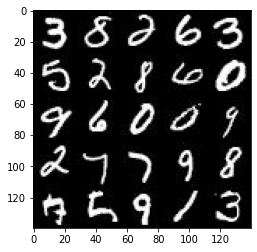

In [3]:
show_n_images = 25

%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

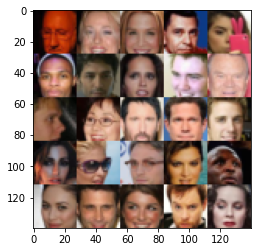

In [4]:
show_n_images = 25

mnist_images = get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
%tensorflow_version 1.x
# on Colab change runtime type to GPU, please

from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow 1.x selected.
TensorFlow Version: 1.15.2
Default GPU Device: /device:GPU:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [0]:
from copy import deepcopy
from unittest import mock
import tensorflow as tf

# Modules

def test_safe(func):
    """
    Isolate tests
    """
    def func_wrapper(*args):
        with tf.Graph().as_default():
            result = func(*args)
        print('Tests Passed')
        return result

    return func_wrapper


def _assert_tensor_shape(tensor, shape, display_name):
    assert tf.assert_rank(tensor, len(shape), message='{} has wrong rank'.format(display_name))

    tensor_shape = tensor.get_shape().as_list() if len(shape) else []

    wrong_dimension = [ten_dim for ten_dim, cor_dim in zip(tensor_shape, shape)
                       if cor_dim is not None and ten_dim != cor_dim]
    assert not wrong_dimension, \
        '{} has wrong shape.  Found {}'.format(display_name, tensor_shape)


def _check_input(tensor, shape, display_name, tf_name=None):
    assert tensor.op.type == 'Placeholder', \
        '{} is not a Placeholder.'.format(display_name)

    _assert_tensor_shape(tensor, shape, 'Real Input')

    if tf_name:
        assert tensor.name == tf_name, \
            '{} has bad name.  Found name {}'.format(display_name, tensor.name)


class TmpMock():
    """
    Mock a attribute.  Restore attribute when exiting scope.
    """
    def __init__(self, module, attrib_name):
        self.original_attrib = deepcopy(getattr(module, attrib_name))
        setattr(module, attrib_name, mock.MagicMock())
        self.module = module
        self.attrib_name = attrib_name

    def __enter__(self):
        return getattr(self.module, self.attrib_name)

    def __exit__(self, type, value, traceback):
        setattr(self.module, self.attrib_name, self.original_attrib)


@test_safe
def test_model_inputs(model_inputs):
    image_width = 28
    image_height = 28
    image_channels = 3
    z_dim = 100
    input_real, input_z, learn_rate = model_inputs(image_width, image_height, image_channels, z_dim)

    _check_input(input_real, [None, image_width, image_height, image_channels], 'Real Input')
    _check_input(input_z, [None, z_dim], 'Z Input')
    _check_input(learn_rate, [], 'Learning Rate')


@test_safe
def test_discriminator(discriminator, tf_module):
    with TmpMock(tf_module, 'variable_scope') as mock_variable_scope:
        image = tf.placeholder(tf.float32, [None, 28, 28, 3])

        output, logits = discriminator(image)
        _assert_tensor_shape(output, [None, 1], 'Discriminator Training(reuse=false) output')
        _assert_tensor_shape(logits, [None, 1], 'Discriminator Training(reuse=false) Logits')
        assert mock_variable_scope.called,\
            'tf.variable_scope not called in Discriminator Training(reuse=false)'
        assert mock_variable_scope.call_args == mock.call('discriminator', reuse=False), \
            'tf.variable_scope called with wrong arguments in Discriminator Training(reuse=false)'

        mock_variable_scope.reset_mock()

        output_reuse, logits_reuse = discriminator(image, True)
        _assert_tensor_shape(output_reuse, [None, 1], 'Discriminator Inference(reuse=True) output')
        _assert_tensor_shape(logits_reuse, [None, 1], 'Discriminator Inference(reuse=True) Logits')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Discriminator Inference(reuse=True)'
        assert mock_variable_scope.call_args == mock.call('discriminator', reuse=True), \
            'tf.variable_scope called with wrong arguments in Discriminator Inference(reuse=True)'


@test_safe
def test_generator(generator, tf_module):
    with TmpMock(tf_module, 'variable_scope') as mock_variable_scope:
        z = tf.placeholder(tf.float32, [None, 100])
        out_channel_dim = 5

        output = generator(z, out_channel_dim)
        _assert_tensor_shape(output, [None, 28, 28, out_channel_dim], 'Generator output (is_train=True)')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Generator Training(reuse=false)'
        assert mock_variable_scope.call_args == mock.call('generator', reuse=False), \
            'tf.variable_scope called with wrong arguments in Generator Training(reuse=false)'

        mock_variable_scope.reset_mock()
        output = generator(z, out_channel_dim, False)
        _assert_tensor_shape(output, [None, 28, 28, out_channel_dim], 'Generator output (is_train=False)')
        assert mock_variable_scope.called, \
            'tf.variable_scope not called in Generator Inference(reuse=True)'
        assert mock_variable_scope.call_args == mock.call('generator', reuse=True), \
            'tf.variable_scope called with wrong arguments in Generator Inference(reuse=True)'


@test_safe
def test_model_loss(model_loss):
    out_channel_dim = 4
    input_real = tf.placeholder(tf.float32, [None, 28, 28, out_channel_dim])
    input_z = tf.placeholder(tf.float32, [None, 100])

    d_loss, g_loss = model_loss(input_real, input_z, out_channel_dim)

    _assert_tensor_shape(d_loss, [], 'Discriminator Loss')
    _assert_tensor_shape(d_loss, [], 'Generator Loss')


@test_safe
def test_model_opt(model_opt, tf_module):
    with TmpMock(tf_module, 'trainable_variables') as mock_trainable_variables:
        with tf.variable_scope('discriminator'):
            discriminator_logits = tf.Variable(tf.zeros([3, 3]))
        with tf.variable_scope('generator'):
            generator_logits = tf.Variable(tf.zeros([3, 3]))

        mock_trainable_variables.return_value = [discriminator_logits, generator_logits]
        d_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=discriminator_logits,
            labels=[[0.0, 0.0, 1.0], [0.0, 1.0, 0.0], [1.0, 0.0, 0.0]]))
        g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(
            logits=generator_logits,
            labels=[[0.0, 0.0, 1.0], [0.0, 1.0, 0.0], [1.0, 0.0, 0.0]]))
        learning_rate = 0.001
        beta1 = 0.9

        d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
        assert mock_trainable_variables.called,\
            'tf.mock_trainable_variables not called'

In [7]:
def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_input_images = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], 'real_input_images')
    input_z = tf.placeholder(tf.float32, [None, z_dim], 'input_z')
    learning_rate = tf.placeholder(tf.float32, [], 'learning_rate')
    return real_input_images, input_z, learning_rate

test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
def discriminator(images, reuse=False, alpha=0.2, keep_prob=0.5):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 28x28xn
        # Convolutional layer, 14x14x64
        conv1 = tf.layers.conv2d(images, 64, 5, 2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        lrelu1 = tf.maximum(alpha * conv1, conv1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob)
        
        # Strided convolutional layer, 7x7x128
        conv2 = tf.layers.conv2d(drop1, 128, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob)
        
        # Strided convolutional layer, 4x4x256
        conv3 = tf.layers.conv2d(drop2, 256, 5, 2, 'same', use_bias=False)
        bn3 = tf.layers.batch_normalization(conv3)
        lrelu3 = tf.maximum(alpha * bn3, bn3)
        drop3 = tf.layers.dropout(lrelu3, keep_prob)
        
        # fully connected
        flat = tf.reshape(drop3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

test_discriminator(discriminator, tf)

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use keras.layers.dropout instead.
Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
Instructions for updating:
Use keras.layers.Dense instead.
Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [9]:
def generator(z, out_channel_dim, is_train=True, alpha=0.2, keep_prob=0.5):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    with tf.variable_scope('generator', reuse=(not is_train)):
        # First fully connected layer, 4x4x1024
        fc = tf.layers.dense(z, 4*4*1024, use_bias=False)
        fc = tf.reshape(fc, (-1, 4, 4, 1024))
        bn0 = tf.layers.batch_normalization(fc, training=is_train)
        lrelu0 = tf.maximum(alpha * bn0, bn0)
        drop0 = tf.layers.dropout(lrelu0, keep_prob, training=is_train)
        
        # Deconvolution, 7x7x512
        conv1 = tf.layers.conv2d_transpose(drop0, 512, 4, 1, 'valid', use_bias=False)
        bn1 = tf.layers.batch_normalization(conv1, training=is_train)
        lrelu1 = tf.maximum(alpha * bn1, bn1)
        drop1 = tf.layers.dropout(lrelu1, keep_prob, training=is_train)
        
        # Deconvolution, 14x14x256
        conv2 = tf.layers.conv2d_transpose(drop1, 256, 5, 2, 'same', use_bias=False)
        bn2 = tf.layers.batch_normalization(conv2, training=is_train)
        lrelu2 = tf.maximum(alpha * bn2, bn2)
        drop2 = tf.layers.dropout(lrelu2, keep_prob, training=is_train)
        
        # Output layer, 28x28xn
        logits = tf.layers.conv2d_transpose(drop2, out_channel_dim, 5, 2, 'same')
        
        out = tf.tanh(logits)
        
        return out

test_generator(generator, tf)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [10]:
def model_loss(input_real, input_z, out_channel_dim, alpha=0.2, smooth_factor=0.1):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    
    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                labels=tf.ones_like(d_model_real) * (1 - smooth_factor)))
    
    input_fake = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(input_fake, reuse=True, alpha=alpha)
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    return d_loss_real + d_loss_fake, g_loss

test_model_loss(model_loss)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [11]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [0]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [0]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode,
          print_every=10, show_every=100):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, _ = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3], alpha=0.2)
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    steps = 0
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                batch_images *= 2.0
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                sess.run(d_train_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                sess.run(g_train_opt, feed_dict={input_z: batch_z})
                
                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                    print("Epoch {}/{} Step {}...".format(epoch_i+1, epoch_count, steps),
                      "Discriminator Loss: {:.4f}...".format(train_loss_d),
                      "Generator Loss: {:.4f}".format(train_loss_g))  

                if steps % show_every == 0:
                    # Show example output for the generator
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode) 

### MNIST
Test your GANs architecture on MNIST.  After 3 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/3 Step 10... Discriminator Loss: 1.2842... Generator Loss: 0.7725
Epoch 1/3 Step 20... Discriminator Loss: 1.3964... Generator Loss: 0.6786
Epoch 1/3 Step 30... Discriminator Loss: 0.8473... Generator Loss: 1.2724
Epoch 1/3 Step 40... Discriminator Loss: 1.5292... Generator Loss: 0.7019
Epoch 1/3 Step 50... Discriminator Loss: 1.2423... Generator Loss: 0.9435
Epoch 1/3 Step 60... Discriminator Loss: 0.9237... Generator Loss: 1.2097
Epoch 1/3 Step 70... Discriminator Loss: 0.8716... Generator Loss: 1.3297
Epoch 1/3 Step 80... Discriminator Loss: 0.9212... Generator Loss: 1.1300
Epoch 1/3 Step 90... Discriminator Loss: 0.8852... Generator Loss: 3.4183
Epoch 1/3 Step 100... Discriminator Loss: 0.9417... Generator Loss: 1.1368


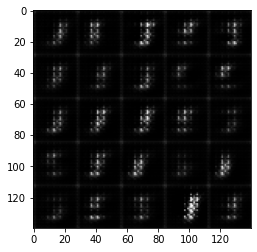

Epoch 1/3 Step 110... Discriminator Loss: 1.0477... Generator Loss: 1.0236
Epoch 1/3 Step 120... Discriminator Loss: 0.9908... Generator Loss: 1.1374
Epoch 1/3 Step 130... Discriminator Loss: 1.0903... Generator Loss: 1.1918
Epoch 1/3 Step 140... Discriminator Loss: 1.1251... Generator Loss: 1.2296
Epoch 1/3 Step 150... Discriminator Loss: 1.0604... Generator Loss: 1.2838
Epoch 1/3 Step 160... Discriminator Loss: 1.5050... Generator Loss: 0.7361
Epoch 1/3 Step 170... Discriminator Loss: 1.1880... Generator Loss: 0.9562
Epoch 1/3 Step 180... Discriminator Loss: 1.2657... Generator Loss: 0.9761
Epoch 1/3 Step 190... Discriminator Loss: 1.2736... Generator Loss: 0.8674
Epoch 1/3 Step 200... Discriminator Loss: 1.2627... Generator Loss: 0.9684


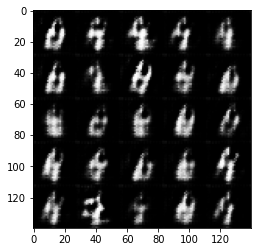

Epoch 1/3 Step 210... Discriminator Loss: 1.5905... Generator Loss: 0.5886
Epoch 1/3 Step 220... Discriminator Loss: 1.6039... Generator Loss: 0.8153
Epoch 1/3 Step 230... Discriminator Loss: 1.3263... Generator Loss: 1.1220
Epoch 1/3 Step 240... Discriminator Loss: 1.2097... Generator Loss: 0.9777
Epoch 1/3 Step 250... Discriminator Loss: 1.0686... Generator Loss: 0.9903
Epoch 1/3 Step 260... Discriminator Loss: 0.8881... Generator Loss: 1.2028
Epoch 1/3 Step 270... Discriminator Loss: 1.5435... Generator Loss: 1.3089
Epoch 1/3 Step 280... Discriminator Loss: 1.1439... Generator Loss: 1.0059
Epoch 1/3 Step 290... Discriminator Loss: 1.2015... Generator Loss: 0.9435
Epoch 1/3 Step 300... Discriminator Loss: 1.3048... Generator Loss: 0.7744


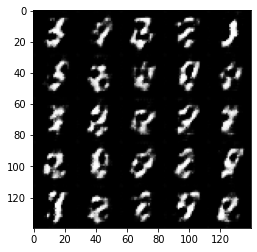

Epoch 1/3 Step 310... Discriminator Loss: 1.0557... Generator Loss: 1.2208
Epoch 1/3 Step 320... Discriminator Loss: 0.9868... Generator Loss: 1.2616
Epoch 1/3 Step 330... Discriminator Loss: 0.9407... Generator Loss: 1.1692
Epoch 1/3 Step 340... Discriminator Loss: 1.0129... Generator Loss: 1.3181
Epoch 1/3 Step 350... Discriminator Loss: 1.2424... Generator Loss: 0.9701
Epoch 1/3 Step 360... Discriminator Loss: 1.2304... Generator Loss: 0.9909
Epoch 1/3 Step 370... Discriminator Loss: 1.1773... Generator Loss: 1.1129
Epoch 1/3 Step 380... Discriminator Loss: 1.3073... Generator Loss: 0.9496
Epoch 1/3 Step 390... Discriminator Loss: 1.0558... Generator Loss: 0.8410
Epoch 1/3 Step 400... Discriminator Loss: 1.1551... Generator Loss: 0.7940


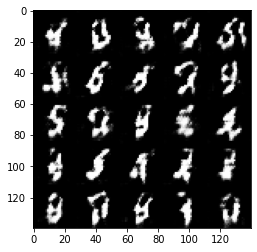

Epoch 1/3 Step 410... Discriminator Loss: 1.2515... Generator Loss: 0.7195
Epoch 1/3 Step 420... Discriminator Loss: 1.0626... Generator Loss: 1.1982
Epoch 1/3 Step 430... Discriminator Loss: 1.1775... Generator Loss: 1.1264
Epoch 1/3 Step 440... Discriminator Loss: 1.1528... Generator Loss: 1.6605
Epoch 1/3 Step 450... Discriminator Loss: 1.2533... Generator Loss: 1.0326
Epoch 1/3 Step 460... Discriminator Loss: 1.0600... Generator Loss: 1.3956
Epoch 1/3 Step 470... Discriminator Loss: 1.2797... Generator Loss: 0.7933
Epoch 1/3 Step 480... Discriminator Loss: 1.2289... Generator Loss: 1.6367
Epoch 1/3 Step 490... Discriminator Loss: 1.3186... Generator Loss: 1.0867
Epoch 1/3 Step 500... Discriminator Loss: 1.0572... Generator Loss: 1.1994


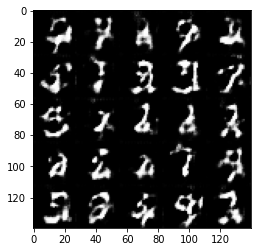

Epoch 1/3 Step 510... Discriminator Loss: 1.1338... Generator Loss: 1.6209
Epoch 1/3 Step 520... Discriminator Loss: 1.0935... Generator Loss: 0.9011
Epoch 1/3 Step 530... Discriminator Loss: 1.2600... Generator Loss: 0.9020
Epoch 1/3 Step 540... Discriminator Loss: 1.1477... Generator Loss: 1.0779
Epoch 1/3 Step 550... Discriminator Loss: 1.1279... Generator Loss: 1.7154
Epoch 1/3 Step 560... Discriminator Loss: 1.0978... Generator Loss: 0.9996
Epoch 1/3 Step 570... Discriminator Loss: 1.2979... Generator Loss: 1.1053
Epoch 1/3 Step 580... Discriminator Loss: 1.1818... Generator Loss: 0.9274
Epoch 1/3 Step 590... Discriminator Loss: 1.2783... Generator Loss: 1.4121
Epoch 1/3 Step 600... Discriminator Loss: 1.1574... Generator Loss: 1.3306


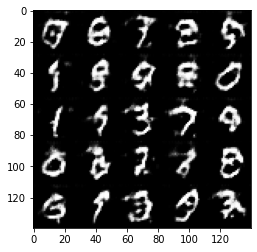

Epoch 1/3 Step 610... Discriminator Loss: 1.2096... Generator Loss: 0.7876
Epoch 1/3 Step 620... Discriminator Loss: 1.2106... Generator Loss: 0.8410
Epoch 1/3 Step 630... Discriminator Loss: 1.2156... Generator Loss: 0.6554
Epoch 1/3 Step 640... Discriminator Loss: 1.1918... Generator Loss: 0.7745
Epoch 1/3 Step 650... Discriminator Loss: 1.3151... Generator Loss: 0.7744
Epoch 1/3 Step 660... Discriminator Loss: 1.1094... Generator Loss: 1.0294
Epoch 1/3 Step 670... Discriminator Loss: 1.2140... Generator Loss: 0.9534
Epoch 1/3 Step 680... Discriminator Loss: 1.1980... Generator Loss: 1.1970
Epoch 1/3 Step 690... Discriminator Loss: 1.5495... Generator Loss: 0.7376
Epoch 1/3 Step 700... Discriminator Loss: 1.1749... Generator Loss: 0.8707


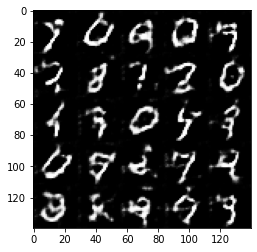

Epoch 1/3 Step 710... Discriminator Loss: 1.1740... Generator Loss: 0.9027
Epoch 1/3 Step 720... Discriminator Loss: 1.1781... Generator Loss: 0.8672
Epoch 1/3 Step 730... Discriminator Loss: 1.1184... Generator Loss: 1.0233
Epoch 1/3 Step 740... Discriminator Loss: 1.1973... Generator Loss: 0.9798
Epoch 1/3 Step 750... Discriminator Loss: 1.2742... Generator Loss: 0.6679
Epoch 1/3 Step 760... Discriminator Loss: 1.3368... Generator Loss: 0.6163
Epoch 1/3 Step 770... Discriminator Loss: 1.1799... Generator Loss: 1.1859
Epoch 1/3 Step 780... Discriminator Loss: 1.5740... Generator Loss: 1.4590
Epoch 1/3 Step 790... Discriminator Loss: 1.2187... Generator Loss: 0.8733
Epoch 1/3 Step 800... Discriminator Loss: 1.2152... Generator Loss: 0.8252


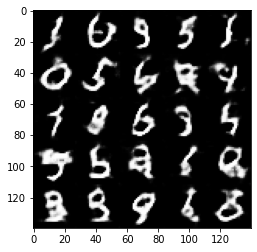

Epoch 1/3 Step 810... Discriminator Loss: 1.1956... Generator Loss: 0.9900
Epoch 1/3 Step 820... Discriminator Loss: 1.2884... Generator Loss: 1.5390
Epoch 1/3 Step 830... Discriminator Loss: 1.2035... Generator Loss: 0.9132
Epoch 1/3 Step 840... Discriminator Loss: 1.0703... Generator Loss: 1.2395
Epoch 1/3 Step 850... Discriminator Loss: 1.2156... Generator Loss: 0.9419
Epoch 1/3 Step 860... Discriminator Loss: 1.0964... Generator Loss: 1.0162
Epoch 1/3 Step 870... Discriminator Loss: 1.2207... Generator Loss: 1.5313
Epoch 1/3 Step 880... Discriminator Loss: 1.2325... Generator Loss: 1.2071
Epoch 1/3 Step 890... Discriminator Loss: 1.2621... Generator Loss: 0.6873
Epoch 1/3 Step 900... Discriminator Loss: 1.2688... Generator Loss: 0.7271


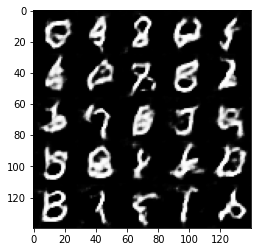

Epoch 1/3 Step 910... Discriminator Loss: 1.3658... Generator Loss: 0.6024
Epoch 1/3 Step 920... Discriminator Loss: 1.1727... Generator Loss: 0.8805
Epoch 1/3 Step 930... Discriminator Loss: 1.1706... Generator Loss: 1.0704
Epoch 2/3 Step 940... Discriminator Loss: 1.2071... Generator Loss: 0.7369
Epoch 2/3 Step 950... Discriminator Loss: 1.0896... Generator Loss: 0.9128
Epoch 2/3 Step 960... Discriminator Loss: 1.0676... Generator Loss: 1.2861
Epoch 2/3 Step 970... Discriminator Loss: 1.1514... Generator Loss: 1.0191
Epoch 2/3 Step 980... Discriminator Loss: 1.1995... Generator Loss: 0.9675
Epoch 2/3 Step 990... Discriminator Loss: 1.2074... Generator Loss: 0.7653
Epoch 2/3 Step 1000... Discriminator Loss: 1.0493... Generator Loss: 1.0561


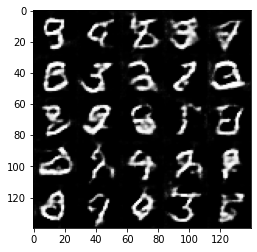

Epoch 2/3 Step 1010... Discriminator Loss: 1.1613... Generator Loss: 0.8985
Epoch 2/3 Step 1020... Discriminator Loss: 1.2339... Generator Loss: 0.9816
Epoch 2/3 Step 1030... Discriminator Loss: 1.1160... Generator Loss: 1.1034
Epoch 2/3 Step 1040... Discriminator Loss: 1.1737... Generator Loss: 0.8227
Epoch 2/3 Step 1050... Discriminator Loss: 1.1331... Generator Loss: 0.8457
Epoch 2/3 Step 1060... Discriminator Loss: 1.1638... Generator Loss: 0.7976
Epoch 2/3 Step 1070... Discriminator Loss: 1.1391... Generator Loss: 1.5290
Epoch 2/3 Step 1080... Discriminator Loss: 1.1745... Generator Loss: 0.8359
Epoch 2/3 Step 1090... Discriminator Loss: 1.2376... Generator Loss: 1.2649
Epoch 2/3 Step 1100... Discriminator Loss: 1.1245... Generator Loss: 0.8902


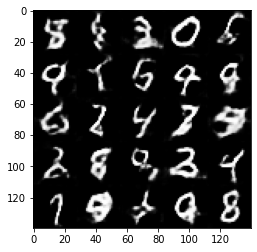

Epoch 2/3 Step 1110... Discriminator Loss: 1.1557... Generator Loss: 1.1611
Epoch 2/3 Step 1120... Discriminator Loss: 1.1411... Generator Loss: 1.0385
Epoch 2/3 Step 1130... Discriminator Loss: 1.1402... Generator Loss: 0.8926
Epoch 2/3 Step 1140... Discriminator Loss: 1.2036... Generator Loss: 1.2359
Epoch 2/3 Step 1150... Discriminator Loss: 1.2399... Generator Loss: 0.6553
Epoch 2/3 Step 1160... Discriminator Loss: 1.0720... Generator Loss: 1.1338
Epoch 2/3 Step 1170... Discriminator Loss: 1.1268... Generator Loss: 0.9433
Epoch 2/3 Step 1180... Discriminator Loss: 1.1013... Generator Loss: 1.0635
Epoch 2/3 Step 1190... Discriminator Loss: 1.1671... Generator Loss: 0.7133
Epoch 2/3 Step 1200... Discriminator Loss: 1.1029... Generator Loss: 1.1378


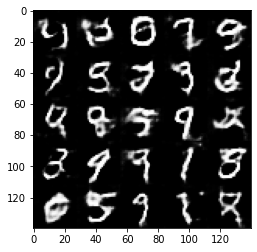

Epoch 2/3 Step 1210... Discriminator Loss: 1.0666... Generator Loss: 1.3005
Epoch 2/3 Step 1220... Discriminator Loss: 1.1974... Generator Loss: 0.9393
Epoch 2/3 Step 1230... Discriminator Loss: 1.2676... Generator Loss: 0.8181
Epoch 2/3 Step 1240... Discriminator Loss: 1.0868... Generator Loss: 1.2230
Epoch 2/3 Step 1250... Discriminator Loss: 0.9522... Generator Loss: 1.0685
Epoch 2/3 Step 1260... Discriminator Loss: 1.1067... Generator Loss: 1.4580
Epoch 2/3 Step 1270... Discriminator Loss: 1.0830... Generator Loss: 1.0225
Epoch 2/3 Step 1280... Discriminator Loss: 1.1925... Generator Loss: 1.3630
Epoch 2/3 Step 1290... Discriminator Loss: 1.1711... Generator Loss: 0.8479
Epoch 2/3 Step 1300... Discriminator Loss: 1.2198... Generator Loss: 1.1599


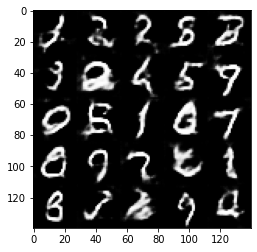

Epoch 2/3 Step 1310... Discriminator Loss: 1.1989... Generator Loss: 1.1756
Epoch 2/3 Step 1320... Discriminator Loss: 1.0562... Generator Loss: 1.0517
Epoch 2/3 Step 1330... Discriminator Loss: 1.1303... Generator Loss: 1.2334
Epoch 2/3 Step 1340... Discriminator Loss: 1.1912... Generator Loss: 1.2906
Epoch 2/3 Step 1350... Discriminator Loss: 1.2057... Generator Loss: 1.4873
Epoch 2/3 Step 1360... Discriminator Loss: 1.1129... Generator Loss: 0.8813
Epoch 2/3 Step 1370... Discriminator Loss: 1.1125... Generator Loss: 1.0027
Epoch 2/3 Step 1380... Discriminator Loss: 1.0904... Generator Loss: 1.2126
Epoch 2/3 Step 1390... Discriminator Loss: 1.4841... Generator Loss: 0.4372
Epoch 2/3 Step 1400... Discriminator Loss: 1.0859... Generator Loss: 1.1798


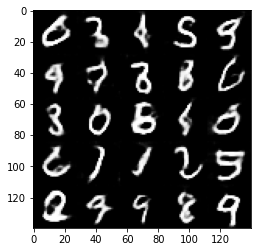

Epoch 2/3 Step 1410... Discriminator Loss: 1.1613... Generator Loss: 0.8381
Epoch 2/3 Step 1420... Discriminator Loss: 1.1033... Generator Loss: 1.2837
Epoch 2/3 Step 1430... Discriminator Loss: 1.1197... Generator Loss: 1.1850
Epoch 2/3 Step 1440... Discriminator Loss: 1.0344... Generator Loss: 1.0086
Epoch 2/3 Step 1450... Discriminator Loss: 1.1793... Generator Loss: 0.8330
Epoch 2/3 Step 1460... Discriminator Loss: 1.1033... Generator Loss: 1.0652
Epoch 2/3 Step 1470... Discriminator Loss: 1.2479... Generator Loss: 1.7394
Epoch 2/3 Step 1480... Discriminator Loss: 1.0753... Generator Loss: 1.0951
Epoch 2/3 Step 1490... Discriminator Loss: 1.0596... Generator Loss: 1.0121
Epoch 2/3 Step 1500... Discriminator Loss: 1.0205... Generator Loss: 1.0702


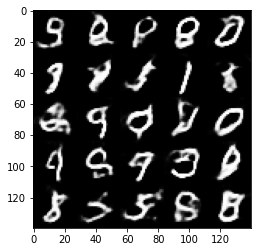

Epoch 2/3 Step 1510... Discriminator Loss: 1.0213... Generator Loss: 1.2191
Epoch 2/3 Step 1520... Discriminator Loss: 0.9801... Generator Loss: 1.1192
Epoch 2/3 Step 1530... Discriminator Loss: 1.1898... Generator Loss: 1.6133
Epoch 2/3 Step 1540... Discriminator Loss: 1.1418... Generator Loss: 0.7684
Epoch 2/3 Step 1550... Discriminator Loss: 1.0690... Generator Loss: 1.3378
Epoch 2/3 Step 1560... Discriminator Loss: 1.1079... Generator Loss: 1.2770
Epoch 2/3 Step 1570... Discriminator Loss: 1.0744... Generator Loss: 0.9878
Epoch 2/3 Step 1580... Discriminator Loss: 1.1514... Generator Loss: 0.7839
Epoch 2/3 Step 1590... Discriminator Loss: 1.0935... Generator Loss: 1.0750
Epoch 2/3 Step 1600... Discriminator Loss: 1.0895... Generator Loss: 1.2170


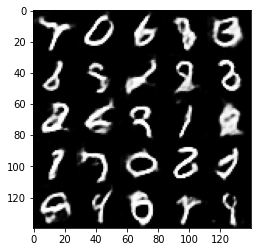

Epoch 2/3 Step 1610... Discriminator Loss: 1.1252... Generator Loss: 1.7508
Epoch 2/3 Step 1620... Discriminator Loss: 1.1097... Generator Loss: 0.7637
Epoch 2/3 Step 1630... Discriminator Loss: 1.1665... Generator Loss: 0.8356
Epoch 2/3 Step 1640... Discriminator Loss: 1.0470... Generator Loss: 1.0419
Epoch 2/3 Step 1650... Discriminator Loss: 1.0590... Generator Loss: 1.2128
Epoch 2/3 Step 1660... Discriminator Loss: 1.1870... Generator Loss: 0.7746
Epoch 2/3 Step 1670... Discriminator Loss: 1.0273... Generator Loss: 1.2896
Epoch 2/3 Step 1680... Discriminator Loss: 1.0779... Generator Loss: 1.0061
Epoch 2/3 Step 1690... Discriminator Loss: 1.1248... Generator Loss: 1.5568
Epoch 2/3 Step 1700... Discriminator Loss: 0.9791... Generator Loss: 1.1601


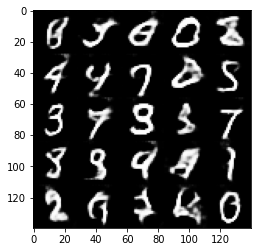

Epoch 2/3 Step 1710... Discriminator Loss: 1.0018... Generator Loss: 1.2782
Epoch 2/3 Step 1720... Discriminator Loss: 0.9846... Generator Loss: 1.5283
Epoch 2/3 Step 1730... Discriminator Loss: 1.0997... Generator Loss: 1.5786
Epoch 2/3 Step 1740... Discriminator Loss: 0.9991... Generator Loss: 1.0343
Epoch 2/3 Step 1750... Discriminator Loss: 1.0352... Generator Loss: 1.1629
Epoch 2/3 Step 1760... Discriminator Loss: 1.1097... Generator Loss: 1.4805
Epoch 2/3 Step 1770... Discriminator Loss: 1.0721... Generator Loss: 1.4901
Epoch 2/3 Step 1780... Discriminator Loss: 0.9290... Generator Loss: 1.3490
Epoch 2/3 Step 1790... Discriminator Loss: 1.1325... Generator Loss: 0.8551
Epoch 2/3 Step 1800... Discriminator Loss: 1.1575... Generator Loss: 1.6774


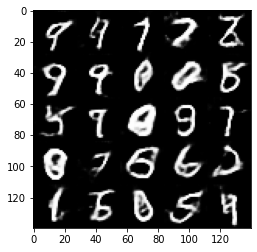

Epoch 2/3 Step 1810... Discriminator Loss: 1.0018... Generator Loss: 1.2258
Epoch 2/3 Step 1820... Discriminator Loss: 1.0719... Generator Loss: 1.5240
Epoch 2/3 Step 1830... Discriminator Loss: 0.9794... Generator Loss: 0.9689
Epoch 2/3 Step 1840... Discriminator Loss: 1.0295... Generator Loss: 1.2392
Epoch 2/3 Step 1850... Discriminator Loss: 1.0421... Generator Loss: 1.3369
Epoch 2/3 Step 1860... Discriminator Loss: 0.9918... Generator Loss: 1.5265
Epoch 2/3 Step 1870... Discriminator Loss: 1.0363... Generator Loss: 1.1571
Epoch 3/3 Step 1880... Discriminator Loss: 1.0919... Generator Loss: 1.5471
Epoch 3/3 Step 1890... Discriminator Loss: 1.0518... Generator Loss: 1.3968
Epoch 3/3 Step 1900... Discriminator Loss: 1.0263... Generator Loss: 1.3393


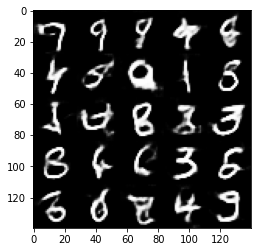

Epoch 3/3 Step 1910... Discriminator Loss: 1.0477... Generator Loss: 1.9652
Epoch 3/3 Step 1920... Discriminator Loss: 1.0432... Generator Loss: 1.0579
Epoch 3/3 Step 1930... Discriminator Loss: 1.0168... Generator Loss: 1.6088
Epoch 3/3 Step 1940... Discriminator Loss: 0.9535... Generator Loss: 1.3745
Epoch 3/3 Step 1950... Discriminator Loss: 1.0138... Generator Loss: 1.2937
Epoch 3/3 Step 1960... Discriminator Loss: 1.1504... Generator Loss: 0.8942
Epoch 3/3 Step 1970... Discriminator Loss: 1.0295... Generator Loss: 1.5163
Epoch 3/3 Step 1980... Discriminator Loss: 0.9960... Generator Loss: 1.1975
Epoch 3/3 Step 1990... Discriminator Loss: 1.1245... Generator Loss: 1.7582
Epoch 3/3 Step 2000... Discriminator Loss: 0.9912... Generator Loss: 1.6040


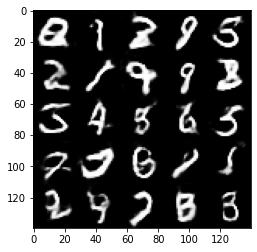

Epoch 3/3 Step 2010... Discriminator Loss: 0.9708... Generator Loss: 1.4128
Epoch 3/3 Step 2020... Discriminator Loss: 1.1126... Generator Loss: 1.0430
Epoch 3/3 Step 2030... Discriminator Loss: 1.1360... Generator Loss: 1.7148
Epoch 3/3 Step 2040... Discriminator Loss: 1.0398... Generator Loss: 1.5822
Epoch 3/3 Step 2050... Discriminator Loss: 0.9742... Generator Loss: 1.2085
Epoch 3/3 Step 2060... Discriminator Loss: 1.1013... Generator Loss: 0.8888
Epoch 3/3 Step 2070... Discriminator Loss: 1.0014... Generator Loss: 1.0988
Epoch 3/3 Step 2080... Discriminator Loss: 1.0437... Generator Loss: 1.2494
Epoch 3/3 Step 2090... Discriminator Loss: 1.1177... Generator Loss: 1.1660
Epoch 3/3 Step 2100... Discriminator Loss: 0.8857... Generator Loss: 1.4458


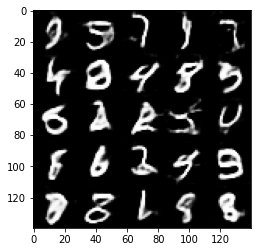

Epoch 3/3 Step 2110... Discriminator Loss: 0.9465... Generator Loss: 1.2799
Epoch 3/3 Step 2120... Discriminator Loss: 1.4557... Generator Loss: 0.4831
Epoch 3/3 Step 2130... Discriminator Loss: 1.0666... Generator Loss: 1.7039
Epoch 3/3 Step 2140... Discriminator Loss: 0.9781... Generator Loss: 1.2591
Epoch 3/3 Step 2150... Discriminator Loss: 0.8729... Generator Loss: 1.3371
Epoch 3/3 Step 2160... Discriminator Loss: 0.9866... Generator Loss: 1.2207
Epoch 3/3 Step 2170... Discriminator Loss: 0.9410... Generator Loss: 1.3260
Epoch 3/3 Step 2180... Discriminator Loss: 1.1767... Generator Loss: 0.7857
Epoch 3/3 Step 2190... Discriminator Loss: 0.9377... Generator Loss: 1.2305
Epoch 3/3 Step 2200... Discriminator Loss: 1.5288... Generator Loss: 2.8271


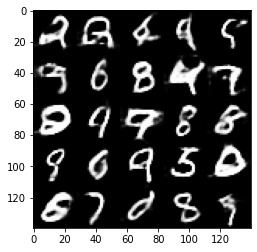

Epoch 3/3 Step 2210... Discriminator Loss: 1.0472... Generator Loss: 1.8571
Epoch 3/3 Step 2220... Discriminator Loss: 1.0313... Generator Loss: 1.3010
Epoch 3/3 Step 2230... Discriminator Loss: 1.0059... Generator Loss: 1.6518
Epoch 3/3 Step 2240... Discriminator Loss: 0.9154... Generator Loss: 1.4765
Epoch 3/3 Step 2250... Discriminator Loss: 1.0666... Generator Loss: 1.3715
Epoch 3/3 Step 2260... Discriminator Loss: 1.1153... Generator Loss: 0.8441
Epoch 3/3 Step 2270... Discriminator Loss: 1.0321... Generator Loss: 1.9037
Epoch 3/3 Step 2280... Discriminator Loss: 0.9852... Generator Loss: 1.5483
Epoch 3/3 Step 2290... Discriminator Loss: 0.8968... Generator Loss: 1.2394
Epoch 3/3 Step 2300... Discriminator Loss: 1.0722... Generator Loss: 0.9632


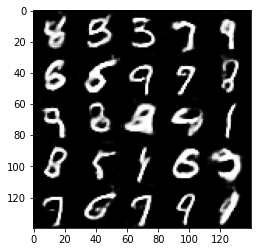

Epoch 3/3 Step 2310... Discriminator Loss: 1.0431... Generator Loss: 1.0848
Epoch 3/3 Step 2320... Discriminator Loss: 0.8958... Generator Loss: 1.5025
Epoch 3/3 Step 2330... Discriminator Loss: 1.0882... Generator Loss: 0.9314
Epoch 3/3 Step 2340... Discriminator Loss: 1.0820... Generator Loss: 1.2125
Epoch 3/3 Step 2350... Discriminator Loss: 1.4259... Generator Loss: 0.5451
Epoch 3/3 Step 2360... Discriminator Loss: 0.9716... Generator Loss: 1.1533
Epoch 3/3 Step 2370... Discriminator Loss: 0.9439... Generator Loss: 1.4038
Epoch 3/3 Step 2380... Discriminator Loss: 1.1205... Generator Loss: 0.8372
Epoch 3/3 Step 2390... Discriminator Loss: 0.9335... Generator Loss: 1.2415
Epoch 3/3 Step 2400... Discriminator Loss: 0.9675... Generator Loss: 1.7132


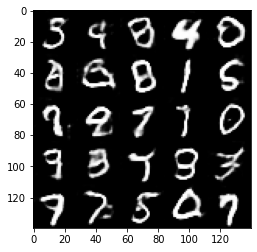

Epoch 3/3 Step 2410... Discriminator Loss: 1.0462... Generator Loss: 1.0137
Epoch 3/3 Step 2420... Discriminator Loss: 0.9899... Generator Loss: 1.4628
Epoch 3/3 Step 2430... Discriminator Loss: 0.9002... Generator Loss: 1.5008
Epoch 3/3 Step 2440... Discriminator Loss: 0.9392... Generator Loss: 1.1697
Epoch 3/3 Step 2450... Discriminator Loss: 0.9650... Generator Loss: 1.0975
Epoch 3/3 Step 2460... Discriminator Loss: 0.8946... Generator Loss: 1.1908
Epoch 3/3 Step 2470... Discriminator Loss: 1.0257... Generator Loss: 0.9663
Epoch 3/3 Step 2480... Discriminator Loss: 0.9524... Generator Loss: 1.7616
Epoch 3/3 Step 2490... Discriminator Loss: 0.9979... Generator Loss: 1.2460
Epoch 3/3 Step 2500... Discriminator Loss: 0.9246... Generator Loss: 1.3751


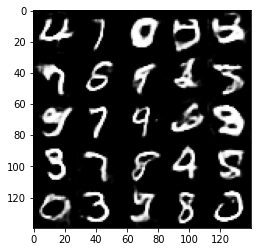

Epoch 3/3 Step 2510... Discriminator Loss: 0.9469... Generator Loss: 1.9207
Epoch 3/3 Step 2520... Discriminator Loss: 0.9526... Generator Loss: 1.1360
Epoch 3/3 Step 2530... Discriminator Loss: 1.0249... Generator Loss: 2.1043
Epoch 3/3 Step 2540... Discriminator Loss: 0.9844... Generator Loss: 1.7121
Epoch 3/3 Step 2550... Discriminator Loss: 0.9249... Generator Loss: 1.0425
Epoch 3/3 Step 2560... Discriminator Loss: 0.9006... Generator Loss: 1.7056
Epoch 3/3 Step 2570... Discriminator Loss: 1.3168... Generator Loss: 2.1199
Epoch 3/3 Step 2580... Discriminator Loss: 1.0143... Generator Loss: 1.4637
Epoch 3/3 Step 2590... Discriminator Loss: 0.8679... Generator Loss: 1.5103
Epoch 3/3 Step 2600... Discriminator Loss: 0.9518... Generator Loss: 1.2259


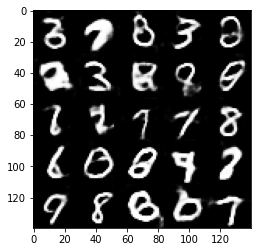

Epoch 3/3 Step 2610... Discriminator Loss: 1.0251... Generator Loss: 1.5502
Epoch 3/3 Step 2620... Discriminator Loss: 0.8911... Generator Loss: 1.4385
Epoch 3/3 Step 2630... Discriminator Loss: 0.8710... Generator Loss: 1.6712
Epoch 3/3 Step 2640... Discriminator Loss: 0.9300... Generator Loss: 1.6033
Epoch 3/3 Step 2650... Discriminator Loss: 0.9263... Generator Loss: 1.6699
Epoch 3/3 Step 2660... Discriminator Loss: 1.0692... Generator Loss: 2.1896
Epoch 3/3 Step 2670... Discriminator Loss: 1.0125... Generator Loss: 1.1026
Epoch 3/3 Step 2680... Discriminator Loss: 0.7743... Generator Loss: 1.4065
Epoch 3/3 Step 2690... Discriminator Loss: 0.9954... Generator Loss: 1.0253
Epoch 3/3 Step 2700... Discriminator Loss: 0.9976... Generator Loss: 1.7031


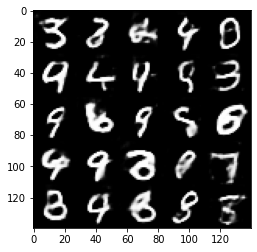

Epoch 3/3 Step 2710... Discriminator Loss: 0.9764... Generator Loss: 1.8354
Epoch 3/3 Step 2720... Discriminator Loss: 0.9575... Generator Loss: 1.1515
Epoch 3/3 Step 2730... Discriminator Loss: 1.0073... Generator Loss: 1.0633
Epoch 3/3 Step 2740... Discriminator Loss: 0.9548... Generator Loss: 1.8132
Epoch 3/3 Step 2750... Discriminator Loss: 1.0461... Generator Loss: 0.9445
Epoch 3/3 Step 2760... Discriminator Loss: 0.9792... Generator Loss: 1.0321
Epoch 3/3 Step 2770... Discriminator Loss: 1.1398... Generator Loss: 0.9844
Epoch 3/3 Step 2780... Discriminator Loss: 0.9281... Generator Loss: 1.3111
Epoch 3/3 Step 2790... Discriminator Loss: 1.3124... Generator Loss: 2.8036
Epoch 3/3 Step 2800... Discriminator Loss: 0.8659... Generator Loss: 1.5191


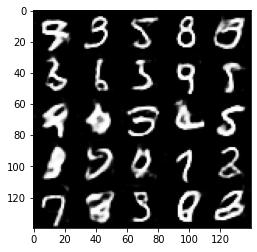

Epoch 3/3 Step 2810... Discriminator Loss: 1.0023... Generator Loss: 2.1651


In [14]:
batch_size = 64
z_dim = 100
learning_rate = 0.00025
beta1 = 0.45

epochs = 3

mnist_dataset = Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/2 Step 10... Discriminator Loss: 1.1397... Generator Loss: 1.0176
Epoch 1/2 Step 20... Discriminator Loss: 1.0724... Generator Loss: 1.0087
Epoch 1/2 Step 30... Discriminator Loss: 1.0078... Generator Loss: 1.5342
Epoch 1/2 Step 40... Discriminator Loss: 1.3635... Generator Loss: 0.5285
Epoch 1/2 Step 50... Discriminator Loss: 1.1882... Generator Loss: 0.9543
Epoch 1/2 Step 60... Discriminator Loss: 1.5339... Generator Loss: 0.4387
Epoch 1/2 Step 70... Discriminator Loss: 0.9210... Generator Loss: 1.4298
Epoch 1/2 Step 80... Discriminator Loss: 0.7156... Generator Loss: 1.8092
Epoch 1/2 Step 90... Discriminator Loss: 1.0838... Generator Loss: 1.6677
Epoch 1/2 Step 100... Discriminator Loss: 0.9475... Generator Loss: 1.2434


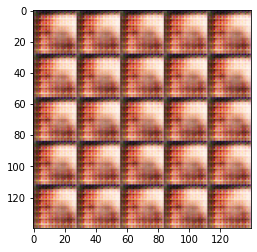

Epoch 1/2 Step 110... Discriminator Loss: 0.6141... Generator Loss: 2.1500
Epoch 1/2 Step 120... Discriminator Loss: 0.9695... Generator Loss: 2.3668
Epoch 1/2 Step 130... Discriminator Loss: 0.7195... Generator Loss: 2.1364
Epoch 1/2 Step 140... Discriminator Loss: 0.6738... Generator Loss: 1.7162
Epoch 1/2 Step 150... Discriminator Loss: 0.6018... Generator Loss: 2.0972
Epoch 1/2 Step 160... Discriminator Loss: 1.6185... Generator Loss: 4.3613
Epoch 1/2 Step 170... Discriminator Loss: 0.6198... Generator Loss: 1.9523
Epoch 1/2 Step 180... Discriminator Loss: 0.6405... Generator Loss: 1.8890
Epoch 1/2 Step 190... Discriminator Loss: 1.0357... Generator Loss: 1.9837
Epoch 1/2 Step 200... Discriminator Loss: 0.6749... Generator Loss: 2.0758


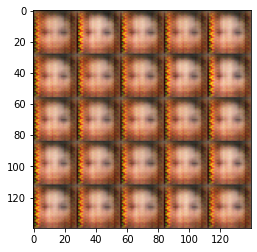

Epoch 1/2 Step 210... Discriminator Loss: 0.6397... Generator Loss: 2.5274
Epoch 1/2 Step 220... Discriminator Loss: 1.5830... Generator Loss: 2.6635
Epoch 1/2 Step 230... Discriminator Loss: 0.7781... Generator Loss: 1.7157
Epoch 1/2 Step 240... Discriminator Loss: 1.4386... Generator Loss: 0.7780
Epoch 1/2 Step 250... Discriminator Loss: 0.9068... Generator Loss: 1.0923
Epoch 1/2 Step 260... Discriminator Loss: 1.1820... Generator Loss: 0.9074
Epoch 1/2 Step 270... Discriminator Loss: 0.9599... Generator Loss: 1.2389
Epoch 1/2 Step 280... Discriminator Loss: 1.0309... Generator Loss: 1.0885
Epoch 1/2 Step 290... Discriminator Loss: 1.0712... Generator Loss: 0.9546
Epoch 1/2 Step 300... Discriminator Loss: 0.8989... Generator Loss: 1.1524


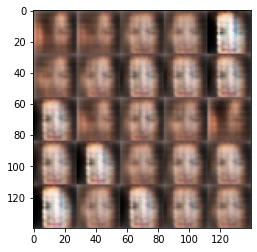

Epoch 1/2 Step 310... Discriminator Loss: 1.0885... Generator Loss: 1.0751
Epoch 1/2 Step 320... Discriminator Loss: 0.9244... Generator Loss: 1.4771
Epoch 1/2 Step 330... Discriminator Loss: 0.7309... Generator Loss: 1.7701
Epoch 1/2 Step 340... Discriminator Loss: 0.9917... Generator Loss: 1.1538
Epoch 1/2 Step 350... Discriminator Loss: 0.9142... Generator Loss: 1.4004
Epoch 1/2 Step 360... Discriminator Loss: 1.3252... Generator Loss: 0.9743
Epoch 1/2 Step 370... Discriminator Loss: 1.2451... Generator Loss: 1.1504
Epoch 1/2 Step 380... Discriminator Loss: 1.0596... Generator Loss: 1.2907
Epoch 1/2 Step 390... Discriminator Loss: 1.1632... Generator Loss: 1.0284
Epoch 1/2 Step 400... Discriminator Loss: 0.9505... Generator Loss: 1.4596


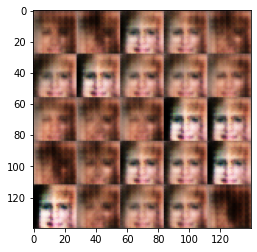

Epoch 1/2 Step 410... Discriminator Loss: 1.2703... Generator Loss: 1.0209
Epoch 1/2 Step 420... Discriminator Loss: 0.9456... Generator Loss: 1.2265
Epoch 1/2 Step 430... Discriminator Loss: 1.2141... Generator Loss: 0.9246
Epoch 1/2 Step 440... Discriminator Loss: 1.1012... Generator Loss: 1.0519
Epoch 1/2 Step 450... Discriminator Loss: 1.0130... Generator Loss: 1.0225
Epoch 1/2 Step 460... Discriminator Loss: 1.1755... Generator Loss: 0.8005
Epoch 1/2 Step 470... Discriminator Loss: 1.2491... Generator Loss: 0.8448
Epoch 1/2 Step 480... Discriminator Loss: 1.2728... Generator Loss: 1.1178
Epoch 1/2 Step 490... Discriminator Loss: 1.1376... Generator Loss: 0.9977
Epoch 1/2 Step 500... Discriminator Loss: 1.1034... Generator Loss: 1.1589


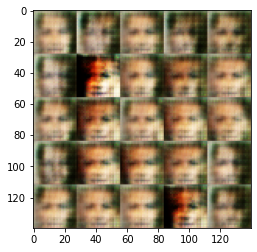

Epoch 1/2 Step 510... Discriminator Loss: 1.2320... Generator Loss: 0.8344
Epoch 1/2 Step 520... Discriminator Loss: 1.2917... Generator Loss: 1.2222
Epoch 1/2 Step 530... Discriminator Loss: 1.3358... Generator Loss: 0.9785
Epoch 1/2 Step 540... Discriminator Loss: 1.2527... Generator Loss: 0.8896
Epoch 1/2 Step 550... Discriminator Loss: 1.1325... Generator Loss: 1.0357
Epoch 1/2 Step 560... Discriminator Loss: 1.1667... Generator Loss: 1.1498
Epoch 1/2 Step 570... Discriminator Loss: 1.1854... Generator Loss: 1.0008
Epoch 1/2 Step 580... Discriminator Loss: 1.2737... Generator Loss: 0.9030
Epoch 1/2 Step 590... Discriminator Loss: 1.2924... Generator Loss: 0.9359
Epoch 1/2 Step 600... Discriminator Loss: 1.2838... Generator Loss: 0.9394


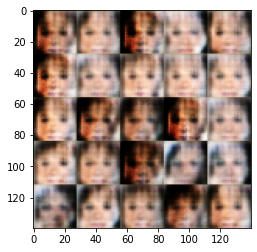

Epoch 1/2 Step 610... Discriminator Loss: 1.2148... Generator Loss: 0.9814
Epoch 1/2 Step 620... Discriminator Loss: 1.0861... Generator Loss: 1.0964
Epoch 1/2 Step 630... Discriminator Loss: 1.1980... Generator Loss: 0.9905
Epoch 1/2 Step 640... Discriminator Loss: 1.2667... Generator Loss: 0.8637
Epoch 1/2 Step 650... Discriminator Loss: 1.2707... Generator Loss: 0.8992
Epoch 1/2 Step 660... Discriminator Loss: 1.2886... Generator Loss: 0.9911
Epoch 1/2 Step 670... Discriminator Loss: 1.4114... Generator Loss: 0.8074
Epoch 1/2 Step 680... Discriminator Loss: 1.2675... Generator Loss: 0.9299
Epoch 1/2 Step 690... Discriminator Loss: 1.1970... Generator Loss: 0.9603
Epoch 1/2 Step 700... Discriminator Loss: 1.1670... Generator Loss: 0.9584


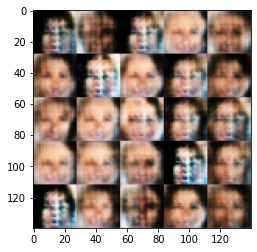

Epoch 1/2 Step 710... Discriminator Loss: 1.2287... Generator Loss: 0.9168
Epoch 1/2 Step 720... Discriminator Loss: 1.2902... Generator Loss: 0.9627
Epoch 1/2 Step 730... Discriminator Loss: 1.2158... Generator Loss: 0.8690
Epoch 1/2 Step 740... Discriminator Loss: 1.2184... Generator Loss: 1.0057
Epoch 1/2 Step 750... Discriminator Loss: 1.3327... Generator Loss: 0.9015
Epoch 1/2 Step 760... Discriminator Loss: 1.2663... Generator Loss: 0.7751
Epoch 1/2 Step 770... Discriminator Loss: 1.2812... Generator Loss: 0.8711
Epoch 1/2 Step 780... Discriminator Loss: 1.3404... Generator Loss: 0.8134
Epoch 1/2 Step 790... Discriminator Loss: 1.2908... Generator Loss: 0.9068
Epoch 1/2 Step 800... Discriminator Loss: 1.2777... Generator Loss: 0.8274


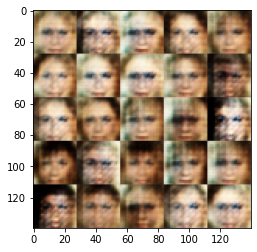

Epoch 1/2 Step 810... Discriminator Loss: 1.2288... Generator Loss: 0.9233
Epoch 1/2 Step 820... Discriminator Loss: 1.2999... Generator Loss: 0.8520
Epoch 1/2 Step 830... Discriminator Loss: 1.3030... Generator Loss: 0.8770
Epoch 1/2 Step 840... Discriminator Loss: 1.2308... Generator Loss: 0.8652
Epoch 1/2 Step 850... Discriminator Loss: 1.2731... Generator Loss: 0.8956
Epoch 1/2 Step 860... Discriminator Loss: 1.3159... Generator Loss: 0.8478
Epoch 1/2 Step 870... Discriminator Loss: 1.2474... Generator Loss: 0.9739
Epoch 1/2 Step 880... Discriminator Loss: 1.2535... Generator Loss: 0.9272
Epoch 1/2 Step 890... Discriminator Loss: 1.2641... Generator Loss: 0.9979
Epoch 1/2 Step 900... Discriminator Loss: 1.2937... Generator Loss: 0.8996


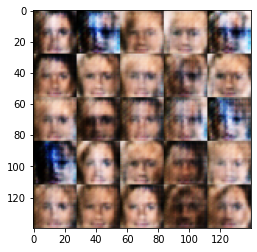

Epoch 1/2 Step 910... Discriminator Loss: 1.2644... Generator Loss: 0.8728
Epoch 1/2 Step 920... Discriminator Loss: 1.2182... Generator Loss: 0.9508
Epoch 1/2 Step 930... Discriminator Loss: 1.3875... Generator Loss: 0.8163
Epoch 1/2 Step 940... Discriminator Loss: 1.3394... Generator Loss: 0.9505
Epoch 1/2 Step 950... Discriminator Loss: 1.2692... Generator Loss: 0.8602
Epoch 1/2 Step 960... Discriminator Loss: 1.2417... Generator Loss: 0.9476
Epoch 1/2 Step 970... Discriminator Loss: 1.3994... Generator Loss: 0.9670
Epoch 1/2 Step 980... Discriminator Loss: 1.3143... Generator Loss: 0.8207
Epoch 1/2 Step 990... Discriminator Loss: 1.2133... Generator Loss: 0.8721
Epoch 1/2 Step 1000... Discriminator Loss: 1.2968... Generator Loss: 0.7115


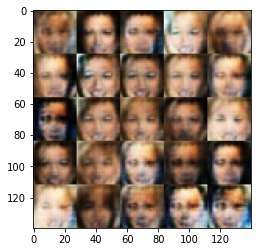

Epoch 1/2 Step 1010... Discriminator Loss: 1.3813... Generator Loss: 0.8977
Epoch 1/2 Step 1020... Discriminator Loss: 1.2181... Generator Loss: 0.9140
Epoch 1/2 Step 1030... Discriminator Loss: 1.2776... Generator Loss: 0.8945
Epoch 1/2 Step 1040... Discriminator Loss: 1.1991... Generator Loss: 1.0136
Epoch 1/2 Step 1050... Discriminator Loss: 1.3109... Generator Loss: 0.8315
Epoch 1/2 Step 1060... Discriminator Loss: 1.3427... Generator Loss: 0.7551
Epoch 1/2 Step 1070... Discriminator Loss: 1.2214... Generator Loss: 0.8903
Epoch 1/2 Step 1080... Discriminator Loss: 1.2488... Generator Loss: 0.8618
Epoch 1/2 Step 1090... Discriminator Loss: 1.2166... Generator Loss: 1.0127
Epoch 1/2 Step 1100... Discriminator Loss: 1.3143... Generator Loss: 0.8453


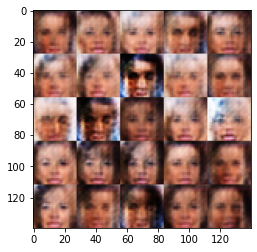

Epoch 1/2 Step 1110... Discriminator Loss: 1.3124... Generator Loss: 0.8765
Epoch 1/2 Step 1120... Discriminator Loss: 1.3861... Generator Loss: 1.0446
Epoch 1/2 Step 1130... Discriminator Loss: 1.4126... Generator Loss: 0.9034
Epoch 1/2 Step 1140... Discriminator Loss: 1.1973... Generator Loss: 0.8623
Epoch 1/2 Step 1150... Discriminator Loss: 1.2222... Generator Loss: 0.9436
Epoch 1/2 Step 1160... Discriminator Loss: 1.2395... Generator Loss: 0.8793
Epoch 1/2 Step 1170... Discriminator Loss: 1.3074... Generator Loss: 0.8253
Epoch 1/2 Step 1180... Discriminator Loss: 1.3525... Generator Loss: 0.8418
Epoch 1/2 Step 1190... Discriminator Loss: 1.2747... Generator Loss: 0.8298
Epoch 1/2 Step 1200... Discriminator Loss: 1.3350... Generator Loss: 0.8209


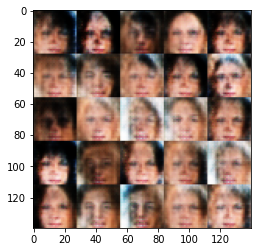

Epoch 1/2 Step 1210... Discriminator Loss: 1.3417... Generator Loss: 0.8184
Epoch 1/2 Step 1220... Discriminator Loss: 1.2033... Generator Loss: 0.9699
Epoch 1/2 Step 1230... Discriminator Loss: 1.2845... Generator Loss: 0.9220
Epoch 1/2 Step 1240... Discriminator Loss: 1.2507... Generator Loss: 0.9747
Epoch 1/2 Step 1250... Discriminator Loss: 1.1814... Generator Loss: 0.7926
Epoch 1/2 Step 1260... Discriminator Loss: 1.3305... Generator Loss: 0.9254
Epoch 1/2 Step 1270... Discriminator Loss: 1.1571... Generator Loss: 0.9669
Epoch 1/2 Step 1280... Discriminator Loss: 1.1641... Generator Loss: 0.9946
Epoch 1/2 Step 1290... Discriminator Loss: 1.2238... Generator Loss: 0.9261
Epoch 1/2 Step 1300... Discriminator Loss: 1.2181... Generator Loss: 0.9389


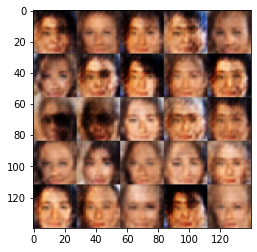

Epoch 1/2 Step 1310... Discriminator Loss: 1.1215... Generator Loss: 0.9300
Epoch 1/2 Step 1320... Discriminator Loss: 1.3161... Generator Loss: 0.9331
Epoch 1/2 Step 1330... Discriminator Loss: 1.2543... Generator Loss: 1.0813
Epoch 1/2 Step 1340... Discriminator Loss: 1.3758... Generator Loss: 1.0102
Epoch 1/2 Step 1350... Discriminator Loss: 1.2258... Generator Loss: 0.9938
Epoch 1/2 Step 1360... Discriminator Loss: 1.3039... Generator Loss: 0.8156
Epoch 1/2 Step 1370... Discriminator Loss: 1.2398... Generator Loss: 0.9403
Epoch 1/2 Step 1380... Discriminator Loss: 1.2889... Generator Loss: 1.0848
Epoch 1/2 Step 1390... Discriminator Loss: 1.2185... Generator Loss: 0.9420
Epoch 1/2 Step 1400... Discriminator Loss: 1.2535... Generator Loss: 0.8425


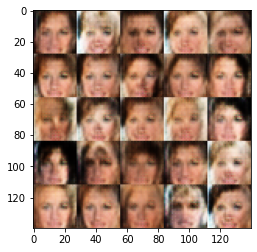

Epoch 1/2 Step 1410... Discriminator Loss: 1.2266... Generator Loss: 0.8432
Epoch 1/2 Step 1420... Discriminator Loss: 1.2310... Generator Loss: 0.9273
Epoch 1/2 Step 1430... Discriminator Loss: 1.2492... Generator Loss: 0.8487
Epoch 1/2 Step 1440... Discriminator Loss: 1.4208... Generator Loss: 0.8177
Epoch 1/2 Step 1450... Discriminator Loss: 1.2548... Generator Loss: 0.7967
Epoch 1/2 Step 1460... Discriminator Loss: 1.2197... Generator Loss: 0.8878
Epoch 1/2 Step 1470... Discriminator Loss: 1.2037... Generator Loss: 0.9483
Epoch 1/2 Step 1480... Discriminator Loss: 1.3087... Generator Loss: 0.8167
Epoch 1/2 Step 1490... Discriminator Loss: 1.2474... Generator Loss: 0.8655
Epoch 1/2 Step 1500... Discriminator Loss: 1.3120... Generator Loss: 0.8613


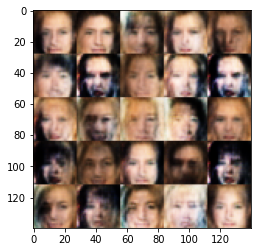

Epoch 1/2 Step 1510... Discriminator Loss: 1.2888... Generator Loss: 0.8523
Epoch 1/2 Step 1520... Discriminator Loss: 1.2914... Generator Loss: 0.8989
Epoch 1/2 Step 1530... Discriminator Loss: 1.2492... Generator Loss: 0.8548
Epoch 1/2 Step 1540... Discriminator Loss: 1.3027... Generator Loss: 0.8758
Epoch 1/2 Step 1550... Discriminator Loss: 1.3985... Generator Loss: 0.8362
Epoch 1/2 Step 1560... Discriminator Loss: 1.3653... Generator Loss: 0.7576
Epoch 1/2 Step 1570... Discriminator Loss: 1.3533... Generator Loss: 0.9655
Epoch 1/2 Step 1580... Discriminator Loss: 1.3075... Generator Loss: 0.9252
Epoch 1/2 Step 1590... Discriminator Loss: 1.3091... Generator Loss: 1.0638
Epoch 1/2 Step 1600... Discriminator Loss: 1.3227... Generator Loss: 0.8410


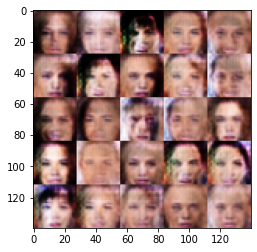

Epoch 1/2 Step 1610... Discriminator Loss: 1.2860... Generator Loss: 0.7759
Epoch 1/2 Step 1620... Discriminator Loss: 1.2446... Generator Loss: 1.0182
Epoch 1/2 Step 1630... Discriminator Loss: 1.3013... Generator Loss: 0.7694
Epoch 1/2 Step 1640... Discriminator Loss: 1.2325... Generator Loss: 0.9054
Epoch 1/2 Step 1650... Discriminator Loss: 1.3366... Generator Loss: 0.7662
Epoch 1/2 Step 1660... Discriminator Loss: 1.2499... Generator Loss: 0.9652
Epoch 1/2 Step 1670... Discriminator Loss: 1.2615... Generator Loss: 0.9162
Epoch 1/2 Step 1680... Discriminator Loss: 1.2681... Generator Loss: 0.8579
Epoch 1/2 Step 1690... Discriminator Loss: 1.2898... Generator Loss: 0.9875
Epoch 1/2 Step 1700... Discriminator Loss: 1.1625... Generator Loss: 1.1951


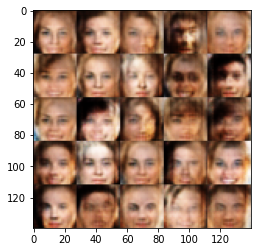

Epoch 1/2 Step 1710... Discriminator Loss: 1.2295... Generator Loss: 0.8237
Epoch 1/2 Step 1720... Discriminator Loss: 1.2799... Generator Loss: 0.8822
Epoch 1/2 Step 1730... Discriminator Loss: 1.2660... Generator Loss: 0.9500
Epoch 1/2 Step 1740... Discriminator Loss: 1.2701... Generator Loss: 0.9281
Epoch 1/2 Step 1750... Discriminator Loss: 1.2555... Generator Loss: 0.9480
Epoch 1/2 Step 1760... Discriminator Loss: 1.2373... Generator Loss: 0.8926
Epoch 1/2 Step 1770... Discriminator Loss: 1.3352... Generator Loss: 1.0307
Epoch 1/2 Step 1780... Discriminator Loss: 1.2271... Generator Loss: 0.9378
Epoch 1/2 Step 1790... Discriminator Loss: 1.2641... Generator Loss: 0.8661
Epoch 1/2 Step 1800... Discriminator Loss: 1.2928... Generator Loss: 0.9653


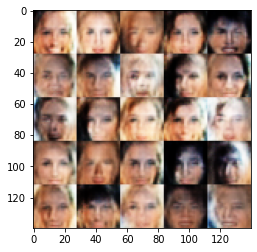

Epoch 1/2 Step 1810... Discriminator Loss: 1.2678... Generator Loss: 0.9151
Epoch 1/2 Step 1820... Discriminator Loss: 1.2745... Generator Loss: 0.9266
Epoch 1/2 Step 1830... Discriminator Loss: 1.1826... Generator Loss: 1.0852
Epoch 1/2 Step 1840... Discriminator Loss: 1.3028... Generator Loss: 0.7220
Epoch 1/2 Step 1850... Discriminator Loss: 1.3017... Generator Loss: 1.0184
Epoch 1/2 Step 1860... Discriminator Loss: 1.1897... Generator Loss: 0.8459
Epoch 1/2 Step 1870... Discriminator Loss: 1.2656... Generator Loss: 0.7541
Epoch 1/2 Step 1880... Discriminator Loss: 1.3124... Generator Loss: 0.8568
Epoch 1/2 Step 1890... Discriminator Loss: 1.2964... Generator Loss: 0.8276
Epoch 1/2 Step 1900... Discriminator Loss: 1.2379... Generator Loss: 1.0555


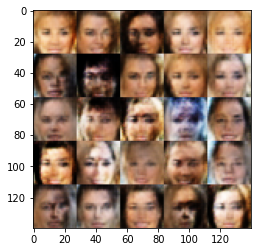

Epoch 1/2 Step 1910... Discriminator Loss: 1.1784... Generator Loss: 0.8474
Epoch 1/2 Step 1920... Discriminator Loss: 1.3600... Generator Loss: 0.7073
Epoch 1/2 Step 1930... Discriminator Loss: 1.2513... Generator Loss: 0.8992
Epoch 1/2 Step 1940... Discriminator Loss: 1.2871... Generator Loss: 0.8858
Epoch 1/2 Step 1950... Discriminator Loss: 1.2055... Generator Loss: 0.8849
Epoch 1/2 Step 1960... Discriminator Loss: 1.2444... Generator Loss: 0.9858
Epoch 1/2 Step 1970... Discriminator Loss: 1.2186... Generator Loss: 1.0158
Epoch 1/2 Step 1980... Discriminator Loss: 1.1700... Generator Loss: 0.9227
Epoch 1/2 Step 1990... Discriminator Loss: 1.2474... Generator Loss: 1.0928
Epoch 1/2 Step 2000... Discriminator Loss: 1.2045... Generator Loss: 0.8891


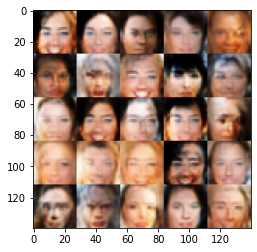

Epoch 1/2 Step 2010... Discriminator Loss: 1.2633... Generator Loss: 0.7579
Epoch 1/2 Step 2020... Discriminator Loss: 1.2249... Generator Loss: 0.9221
Epoch 1/2 Step 2030... Discriminator Loss: 1.1415... Generator Loss: 0.9887
Epoch 1/2 Step 2040... Discriminator Loss: 1.2651... Generator Loss: 0.9628
Epoch 1/2 Step 2050... Discriminator Loss: 1.3157... Generator Loss: 1.0569
Epoch 1/2 Step 2060... Discriminator Loss: 1.3020... Generator Loss: 0.8187
Epoch 1/2 Step 2070... Discriminator Loss: 1.1973... Generator Loss: 0.8859
Epoch 1/2 Step 2080... Discriminator Loss: 1.2393... Generator Loss: 0.8027
Epoch 1/2 Step 2090... Discriminator Loss: 1.2006... Generator Loss: 0.9687
Epoch 1/2 Step 2100... Discriminator Loss: 1.3077... Generator Loss: 0.9289


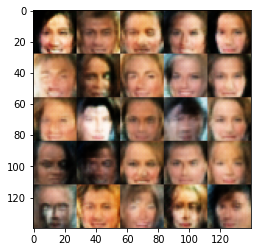

Epoch 1/2 Step 2110... Discriminator Loss: 1.2316... Generator Loss: 0.8749
Epoch 1/2 Step 2120... Discriminator Loss: 1.2619... Generator Loss: 0.8603
Epoch 1/2 Step 2130... Discriminator Loss: 1.2723... Generator Loss: 0.9149
Epoch 1/2 Step 2140... Discriminator Loss: 1.2252... Generator Loss: 0.8789
Epoch 1/2 Step 2150... Discriminator Loss: 1.2922... Generator Loss: 0.8341
Epoch 1/2 Step 2160... Discriminator Loss: 1.1917... Generator Loss: 0.7885
Epoch 1/2 Step 2170... Discriminator Loss: 1.2451... Generator Loss: 1.0238
Epoch 1/2 Step 2180... Discriminator Loss: 1.3618... Generator Loss: 0.8652
Epoch 1/2 Step 2190... Discriminator Loss: 1.1364... Generator Loss: 0.9333
Epoch 1/2 Step 2200... Discriminator Loss: 1.2562... Generator Loss: 0.9497


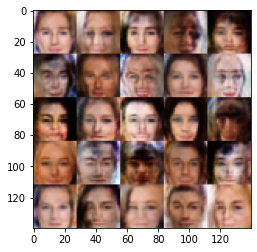

Epoch 1/2 Step 2210... Discriminator Loss: 1.2850... Generator Loss: 0.8959
Epoch 1/2 Step 2220... Discriminator Loss: 1.3346... Generator Loss: 0.7486
Epoch 1/2 Step 2230... Discriminator Loss: 1.2052... Generator Loss: 0.7863
Epoch 1/2 Step 2240... Discriminator Loss: 1.1942... Generator Loss: 0.9572
Epoch 1/2 Step 2250... Discriminator Loss: 1.2576... Generator Loss: 0.7976
Epoch 1/2 Step 2260... Discriminator Loss: 1.1638... Generator Loss: 0.9876
Epoch 1/2 Step 2270... Discriminator Loss: 1.2491... Generator Loss: 0.8438
Epoch 1/2 Step 2280... Discriminator Loss: 1.3264... Generator Loss: 1.3207
Epoch 1/2 Step 2290... Discriminator Loss: 1.3796... Generator Loss: 0.6011
Epoch 1/2 Step 2300... Discriminator Loss: 1.2142... Generator Loss: 0.8979


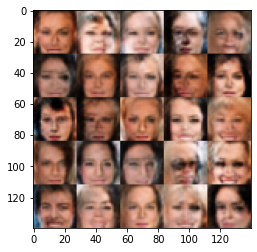

Epoch 1/2 Step 2310... Discriminator Loss: 1.2858... Generator Loss: 0.9405
Epoch 1/2 Step 2320... Discriminator Loss: 1.2435... Generator Loss: 0.9612
Epoch 1/2 Step 2330... Discriminator Loss: 1.1616... Generator Loss: 0.9819
Epoch 1/2 Step 2340... Discriminator Loss: 1.2093... Generator Loss: 0.9221
Epoch 1/2 Step 2350... Discriminator Loss: 1.2858... Generator Loss: 0.6917
Epoch 1/2 Step 2360... Discriminator Loss: 1.2819... Generator Loss: 0.9222
Epoch 1/2 Step 2370... Discriminator Loss: 1.2118... Generator Loss: 0.9416
Epoch 1/2 Step 2380... Discriminator Loss: 1.2742... Generator Loss: 0.8349
Epoch 1/2 Step 2390... Discriminator Loss: 1.2891... Generator Loss: 0.9160
Epoch 1/2 Step 2400... Discriminator Loss: 1.2064... Generator Loss: 1.0341


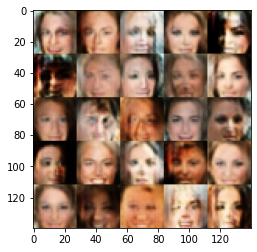

Epoch 1/2 Step 2410... Discriminator Loss: 1.1678... Generator Loss: 0.9489
Epoch 1/2 Step 2420... Discriminator Loss: 1.2051... Generator Loss: 0.9717
Epoch 1/2 Step 2430... Discriminator Loss: 1.1838... Generator Loss: 0.9886
Epoch 1/2 Step 2440... Discriminator Loss: 1.2672... Generator Loss: 0.8843
Epoch 1/2 Step 2450... Discriminator Loss: 1.2015... Generator Loss: 0.9852
Epoch 1/2 Step 2460... Discriminator Loss: 1.2018... Generator Loss: 0.9421
Epoch 1/2 Step 2470... Discriminator Loss: 1.2623... Generator Loss: 0.8725
Epoch 1/2 Step 2480... Discriminator Loss: 1.1812... Generator Loss: 1.0569
Epoch 1/2 Step 2490... Discriminator Loss: 1.2235... Generator Loss: 0.9249
Epoch 1/2 Step 2500... Discriminator Loss: 1.2546... Generator Loss: 0.8791


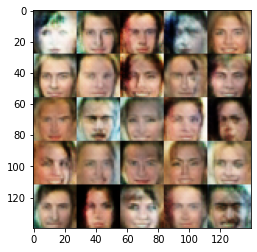

Epoch 1/2 Step 2510... Discriminator Loss: 1.2943... Generator Loss: 0.9932
Epoch 1/2 Step 2520... Discriminator Loss: 1.1781... Generator Loss: 0.8997
Epoch 1/2 Step 2530... Discriminator Loss: 1.2235... Generator Loss: 0.8246
Epoch 1/2 Step 2540... Discriminator Loss: 1.2183... Generator Loss: 0.9531
Epoch 1/2 Step 2550... Discriminator Loss: 1.3142... Generator Loss: 0.9201
Epoch 1/2 Step 2560... Discriminator Loss: 1.3168... Generator Loss: 0.7677
Epoch 1/2 Step 2570... Discriminator Loss: 1.2479... Generator Loss: 0.9212
Epoch 1/2 Step 2580... Discriminator Loss: 1.1845... Generator Loss: 1.0012
Epoch 1/2 Step 2590... Discriminator Loss: 1.1570... Generator Loss: 1.1360
Epoch 1/2 Step 2600... Discriminator Loss: 1.2305... Generator Loss: 1.0476


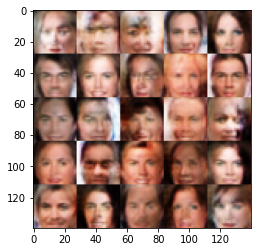

Epoch 1/2 Step 2610... Discriminator Loss: 1.2874... Generator Loss: 1.1869
Epoch 1/2 Step 2620... Discriminator Loss: 1.4356... Generator Loss: 0.7318
Epoch 1/2 Step 2630... Discriminator Loss: 1.1794... Generator Loss: 0.8723
Epoch 1/2 Step 2640... Discriminator Loss: 1.1375... Generator Loss: 0.9065
Epoch 1/2 Step 2650... Discriminator Loss: 1.2450... Generator Loss: 0.9056
Epoch 1/2 Step 2660... Discriminator Loss: 1.2993... Generator Loss: 0.8570
Epoch 1/2 Step 2670... Discriminator Loss: 1.3480... Generator Loss: 1.0843
Epoch 1/2 Step 2680... Discriminator Loss: 1.2654... Generator Loss: 0.8871
Epoch 1/2 Step 2690... Discriminator Loss: 1.2142... Generator Loss: 0.8498
Epoch 1/2 Step 2700... Discriminator Loss: 1.2044... Generator Loss: 0.8403


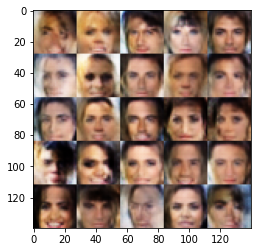

Epoch 1/2 Step 2710... Discriminator Loss: 1.1753... Generator Loss: 1.0356
Epoch 1/2 Step 2720... Discriminator Loss: 1.3422... Generator Loss: 0.8027
Epoch 1/2 Step 2730... Discriminator Loss: 1.2695... Generator Loss: 0.7750
Epoch 1/2 Step 2740... Discriminator Loss: 1.1911... Generator Loss: 0.8945
Epoch 1/2 Step 2750... Discriminator Loss: 1.3127... Generator Loss: 0.9061
Epoch 1/2 Step 2760... Discriminator Loss: 1.3214... Generator Loss: 0.6723
Epoch 1/2 Step 2770... Discriminator Loss: 1.2524... Generator Loss: 0.7663
Epoch 1/2 Step 2780... Discriminator Loss: 1.1756... Generator Loss: 0.9597
Epoch 1/2 Step 2790... Discriminator Loss: 1.3358... Generator Loss: 0.7547
Epoch 1/2 Step 2800... Discriminator Loss: 1.1999... Generator Loss: 1.0627


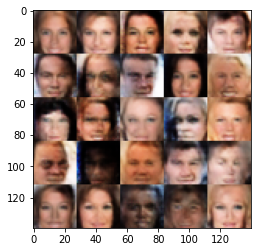

Epoch 1/2 Step 2810... Discriminator Loss: 1.2075... Generator Loss: 0.9298
Epoch 1/2 Step 2820... Discriminator Loss: 1.3485... Generator Loss: 0.6187
Epoch 1/2 Step 2830... Discriminator Loss: 1.2687... Generator Loss: 0.8952
Epoch 1/2 Step 2840... Discriminator Loss: 1.1388... Generator Loss: 1.2024
Epoch 1/2 Step 2850... Discriminator Loss: 1.2543... Generator Loss: 0.7882
Epoch 1/2 Step 2860... Discriminator Loss: 1.2608... Generator Loss: 0.8686
Epoch 1/2 Step 2870... Discriminator Loss: 1.1212... Generator Loss: 0.8667
Epoch 1/2 Step 2880... Discriminator Loss: 1.2251... Generator Loss: 0.8809
Epoch 1/2 Step 2890... Discriminator Loss: 1.3133... Generator Loss: 0.8078
Epoch 1/2 Step 2900... Discriminator Loss: 1.3441... Generator Loss: 0.9041


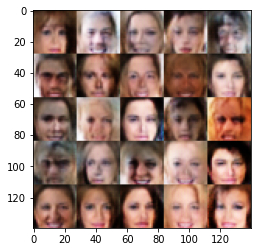

Epoch 1/2 Step 2910... Discriminator Loss: 1.2180... Generator Loss: 0.9873
Epoch 1/2 Step 2920... Discriminator Loss: 1.1452... Generator Loss: 1.2660
Epoch 1/2 Step 2930... Discriminator Loss: 1.1440... Generator Loss: 0.9377
Epoch 1/2 Step 2940... Discriminator Loss: 1.2663... Generator Loss: 0.8751
Epoch 1/2 Step 2950... Discriminator Loss: 1.1478... Generator Loss: 0.8931
Epoch 1/2 Step 2960... Discriminator Loss: 1.2206... Generator Loss: 0.9416
Epoch 1/2 Step 2970... Discriminator Loss: 1.1685... Generator Loss: 1.0057
Epoch 1/2 Step 2980... Discriminator Loss: 1.2244... Generator Loss: 0.9173
Epoch 1/2 Step 2990... Discriminator Loss: 1.1872... Generator Loss: 1.0142
Epoch 1/2 Step 3000... Discriminator Loss: 1.2421... Generator Loss: 0.9600


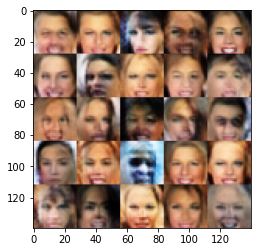

Epoch 1/2 Step 3010... Discriminator Loss: 1.1851... Generator Loss: 0.9104
Epoch 1/2 Step 3020... Discriminator Loss: 1.1569... Generator Loss: 0.9915
Epoch 1/2 Step 3030... Discriminator Loss: 1.2339... Generator Loss: 0.8834
Epoch 1/2 Step 3040... Discriminator Loss: 1.2158... Generator Loss: 0.8986
Epoch 1/2 Step 3050... Discriminator Loss: 1.1691... Generator Loss: 0.9206
Epoch 1/2 Step 3060... Discriminator Loss: 1.3670... Generator Loss: 1.6371
Epoch 1/2 Step 3070... Discriminator Loss: 1.1585... Generator Loss: 1.1420
Epoch 1/2 Step 3080... Discriminator Loss: 1.1612... Generator Loss: 0.9939
Epoch 1/2 Step 3090... Discriminator Loss: 1.1652... Generator Loss: 1.0712
Epoch 1/2 Step 3100... Discriminator Loss: 1.1968... Generator Loss: 0.9765


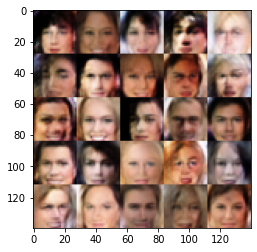

Epoch 1/2 Step 3110... Discriminator Loss: 1.0607... Generator Loss: 0.8869
Epoch 1/2 Step 3120... Discriminator Loss: 1.3035... Generator Loss: 1.2207
Epoch 1/2 Step 3130... Discriminator Loss: 1.2262... Generator Loss: 0.9529
Epoch 1/2 Step 3140... Discriminator Loss: 1.1137... Generator Loss: 0.9304
Epoch 1/2 Step 3150... Discriminator Loss: 1.1730... Generator Loss: 0.9141
Epoch 1/2 Step 3160... Discriminator Loss: 1.2343... Generator Loss: 0.9366
Epoch 2/2 Step 3170... Discriminator Loss: 1.2444... Generator Loss: 0.9432
Epoch 2/2 Step 3180... Discriminator Loss: 1.1818... Generator Loss: 1.0312
Epoch 2/2 Step 3190... Discriminator Loss: 1.1492... Generator Loss: 0.9238
Epoch 2/2 Step 3200... Discriminator Loss: 1.2126... Generator Loss: 1.0476


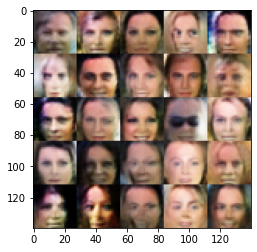

Epoch 2/2 Step 3210... Discriminator Loss: 1.3302... Generator Loss: 1.0495
Epoch 2/2 Step 3220... Discriminator Loss: 1.1909... Generator Loss: 0.9880
Epoch 2/2 Step 3230... Discriminator Loss: 1.2151... Generator Loss: 0.8675
Epoch 2/2 Step 3240... Discriminator Loss: 1.2225... Generator Loss: 0.7760
Epoch 2/2 Step 3250... Discriminator Loss: 1.2152... Generator Loss: 1.1062
Epoch 2/2 Step 3260... Discriminator Loss: 1.2266... Generator Loss: 1.0439
Epoch 2/2 Step 3270... Discriminator Loss: 1.3662... Generator Loss: 1.5962
Epoch 2/2 Step 3280... Discriminator Loss: 1.1726... Generator Loss: 0.9270
Epoch 2/2 Step 3290... Discriminator Loss: 1.1533... Generator Loss: 0.8945
Epoch 2/2 Step 3300... Discriminator Loss: 1.2842... Generator Loss: 1.2521


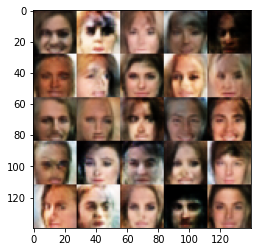

Epoch 2/2 Step 3310... Discriminator Loss: 1.2017... Generator Loss: 0.8934
Epoch 2/2 Step 3320... Discriminator Loss: 1.2070... Generator Loss: 1.0871
Epoch 2/2 Step 3330... Discriminator Loss: 1.1971... Generator Loss: 0.8846
Epoch 2/2 Step 3340... Discriminator Loss: 1.2269... Generator Loss: 1.1559
Epoch 2/2 Step 3350... Discriminator Loss: 1.2750... Generator Loss: 0.8496
Epoch 2/2 Step 3360... Discriminator Loss: 1.1892... Generator Loss: 1.0729
Epoch 2/2 Step 3370... Discriminator Loss: 1.3850... Generator Loss: 0.6871
Epoch 2/2 Step 3380... Discriminator Loss: 1.1699... Generator Loss: 1.0168
Epoch 2/2 Step 3390... Discriminator Loss: 1.2032... Generator Loss: 0.9383
Epoch 2/2 Step 3400... Discriminator Loss: 1.1432... Generator Loss: 1.0010


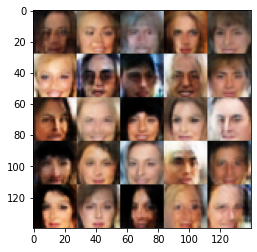

Epoch 2/2 Step 3410... Discriminator Loss: 1.2130... Generator Loss: 0.9094
Epoch 2/2 Step 3420... Discriminator Loss: 1.1668... Generator Loss: 1.3198
Epoch 2/2 Step 3430... Discriminator Loss: 1.2574... Generator Loss: 0.8071
Epoch 2/2 Step 3440... Discriminator Loss: 1.1398... Generator Loss: 1.0596
Epoch 2/2 Step 3450... Discriminator Loss: 1.1903... Generator Loss: 0.8844
Epoch 2/2 Step 3460... Discriminator Loss: 1.1562... Generator Loss: 1.0754
Epoch 2/2 Step 3470... Discriminator Loss: 1.2060... Generator Loss: 0.8981
Epoch 2/2 Step 3480... Discriminator Loss: 1.1959... Generator Loss: 0.8720
Epoch 2/2 Step 3490... Discriminator Loss: 1.1768... Generator Loss: 0.9640
Epoch 2/2 Step 3500... Discriminator Loss: 1.2701... Generator Loss: 0.9814


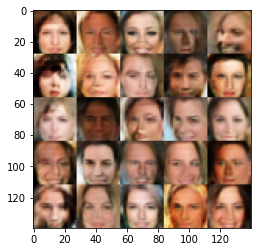

Epoch 2/2 Step 3510... Discriminator Loss: 1.2299... Generator Loss: 0.8954
Epoch 2/2 Step 3520... Discriminator Loss: 1.2737... Generator Loss: 1.2000
Epoch 2/2 Step 3530... Discriminator Loss: 1.1664... Generator Loss: 0.9268
Epoch 2/2 Step 3540... Discriminator Loss: 1.1637... Generator Loss: 0.9617
Epoch 2/2 Step 3550... Discriminator Loss: 1.1408... Generator Loss: 0.9150
Epoch 2/2 Step 3560... Discriminator Loss: 1.3322... Generator Loss: 0.6608
Epoch 2/2 Step 3570... Discriminator Loss: 1.3086... Generator Loss: 0.7864
Epoch 2/2 Step 3580... Discriminator Loss: 1.0959... Generator Loss: 1.2545
Epoch 2/2 Step 3590... Discriminator Loss: 1.0807... Generator Loss: 1.0174
Epoch 2/2 Step 3600... Discriminator Loss: 1.1191... Generator Loss: 0.9597


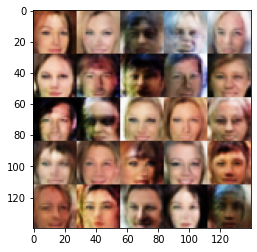

Epoch 2/2 Step 3610... Discriminator Loss: 1.2342... Generator Loss: 0.9771
Epoch 2/2 Step 3620... Discriminator Loss: 1.2124... Generator Loss: 1.1273
Epoch 2/2 Step 3630... Discriminator Loss: 1.1881... Generator Loss: 0.8527
Epoch 2/2 Step 3640... Discriminator Loss: 1.1748... Generator Loss: 1.6170
Epoch 2/2 Step 3650... Discriminator Loss: 1.1604... Generator Loss: 1.1346
Epoch 2/2 Step 3660... Discriminator Loss: 1.2615... Generator Loss: 1.3960
Epoch 2/2 Step 3670... Discriminator Loss: 1.1896... Generator Loss: 0.9110
Epoch 2/2 Step 3680... Discriminator Loss: 1.2203... Generator Loss: 0.9952
Epoch 2/2 Step 3690... Discriminator Loss: 1.2836... Generator Loss: 0.9122
Epoch 2/2 Step 3700... Discriminator Loss: 1.2456... Generator Loss: 0.9427


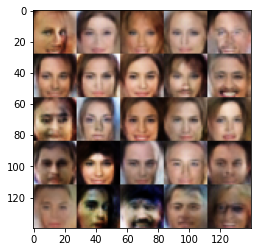

Epoch 2/2 Step 3710... Discriminator Loss: 1.2171... Generator Loss: 0.9820
Epoch 2/2 Step 3720... Discriminator Loss: 1.2352... Generator Loss: 0.7364
Epoch 2/2 Step 3730... Discriminator Loss: 1.1975... Generator Loss: 0.7789
Epoch 2/2 Step 3740... Discriminator Loss: 1.1530... Generator Loss: 1.0097
Epoch 2/2 Step 3750... Discriminator Loss: 1.1764... Generator Loss: 0.9451
Epoch 2/2 Step 3760... Discriminator Loss: 1.1052... Generator Loss: 1.1257
Epoch 2/2 Step 3770... Discriminator Loss: 1.2643... Generator Loss: 0.6948
Epoch 2/2 Step 3780... Discriminator Loss: 1.2264... Generator Loss: 1.2301
Epoch 2/2 Step 3790... Discriminator Loss: 1.1924... Generator Loss: 0.8203
Epoch 2/2 Step 3800... Discriminator Loss: 1.1548... Generator Loss: 1.0253


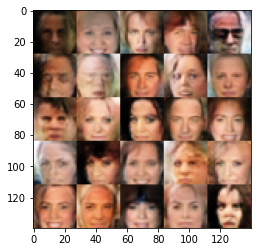

Epoch 2/2 Step 3810... Discriminator Loss: 1.2739... Generator Loss: 0.7887
Epoch 2/2 Step 3820... Discriminator Loss: 1.1546... Generator Loss: 1.0374
Epoch 2/2 Step 3830... Discriminator Loss: 1.1848... Generator Loss: 1.0234
Epoch 2/2 Step 3840... Discriminator Loss: 1.1409... Generator Loss: 0.8927
Epoch 2/2 Step 3850... Discriminator Loss: 1.2220... Generator Loss: 0.9194
Epoch 2/2 Step 3860... Discriminator Loss: 1.0975... Generator Loss: 1.1263
Epoch 2/2 Step 3870... Discriminator Loss: 1.2462... Generator Loss: 1.0143
Epoch 2/2 Step 3880... Discriminator Loss: 1.1932... Generator Loss: 0.9011
Epoch 2/2 Step 3890... Discriminator Loss: 1.0954... Generator Loss: 1.3384
Epoch 2/2 Step 3900... Discriminator Loss: 1.2368... Generator Loss: 0.9563


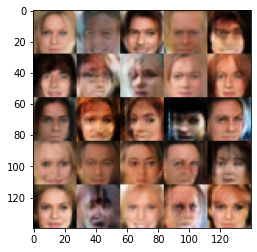

Epoch 2/2 Step 3910... Discriminator Loss: 1.1538... Generator Loss: 0.8417
Epoch 2/2 Step 3920... Discriminator Loss: 1.2202... Generator Loss: 0.9231
Epoch 2/2 Step 3930... Discriminator Loss: 1.1661... Generator Loss: 1.0331
Epoch 2/2 Step 3940... Discriminator Loss: 1.1903... Generator Loss: 1.5502
Epoch 2/2 Step 3950... Discriminator Loss: 1.0956... Generator Loss: 1.1093
Epoch 2/2 Step 3960... Discriminator Loss: 1.1162... Generator Loss: 0.9844
Epoch 2/2 Step 3970... Discriminator Loss: 1.1226... Generator Loss: 0.9651
Epoch 2/2 Step 3980... Discriminator Loss: 1.2053... Generator Loss: 0.9322
Epoch 2/2 Step 3990... Discriminator Loss: 1.2631... Generator Loss: 0.7618
Epoch 2/2 Step 4000... Discriminator Loss: 1.2120... Generator Loss: 1.1299


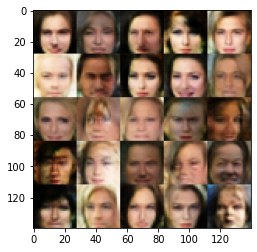

Epoch 2/2 Step 4010... Discriminator Loss: 1.0865... Generator Loss: 1.1327
Epoch 2/2 Step 4020... Discriminator Loss: 1.1871... Generator Loss: 0.8789
Epoch 2/2 Step 4030... Discriminator Loss: 1.2331... Generator Loss: 0.8360
Epoch 2/2 Step 4040... Discriminator Loss: 1.1575... Generator Loss: 1.0431
Epoch 2/2 Step 4050... Discriminator Loss: 1.1070... Generator Loss: 1.0326
Epoch 2/2 Step 4060... Discriminator Loss: 1.1585... Generator Loss: 1.1017
Epoch 2/2 Step 4070... Discriminator Loss: 1.2166... Generator Loss: 0.8550
Epoch 2/2 Step 4080... Discriminator Loss: 1.1420... Generator Loss: 1.0065
Epoch 2/2 Step 4090... Discriminator Loss: 1.2382... Generator Loss: 1.0817
Epoch 2/2 Step 4100... Discriminator Loss: 1.1058... Generator Loss: 0.9901


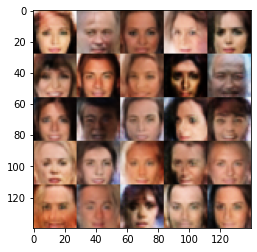

Epoch 2/2 Step 4110... Discriminator Loss: 1.2586... Generator Loss: 1.1241
Epoch 2/2 Step 4120... Discriminator Loss: 1.1315... Generator Loss: 0.9432
Epoch 2/2 Step 4130... Discriminator Loss: 1.1103... Generator Loss: 1.0489
Epoch 2/2 Step 4140... Discriminator Loss: 1.2226... Generator Loss: 0.8964
Epoch 2/2 Step 4150... Discriminator Loss: 1.1052... Generator Loss: 1.0366
Epoch 2/2 Step 4160... Discriminator Loss: 1.2307... Generator Loss: 0.7710
Epoch 2/2 Step 4170... Discriminator Loss: 1.1475... Generator Loss: 1.0599
Epoch 2/2 Step 4180... Discriminator Loss: 1.0560... Generator Loss: 0.9541
Epoch 2/2 Step 4190... Discriminator Loss: 1.0940... Generator Loss: 1.0815
Epoch 2/2 Step 4200... Discriminator Loss: 1.0623... Generator Loss: 1.1423


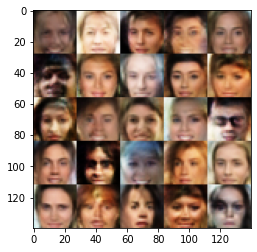

Epoch 2/2 Step 4210... Discriminator Loss: 1.1977... Generator Loss: 0.8387
Epoch 2/2 Step 4220... Discriminator Loss: 1.1693... Generator Loss: 1.1131
Epoch 2/2 Step 4230... Discriminator Loss: 1.2107... Generator Loss: 0.9825
Epoch 2/2 Step 4240... Discriminator Loss: 1.1943... Generator Loss: 1.0799
Epoch 2/2 Step 4250... Discriminator Loss: 1.1285... Generator Loss: 1.2200
Epoch 2/2 Step 4260... Discriminator Loss: 1.1370... Generator Loss: 1.0737
Epoch 2/2 Step 4270... Discriminator Loss: 1.2581... Generator Loss: 1.4521
Epoch 2/2 Step 4280... Discriminator Loss: 1.1253... Generator Loss: 0.8322
Epoch 2/2 Step 4290... Discriminator Loss: 1.1785... Generator Loss: 0.8985
Epoch 2/2 Step 4300... Discriminator Loss: 1.1097... Generator Loss: 1.0961


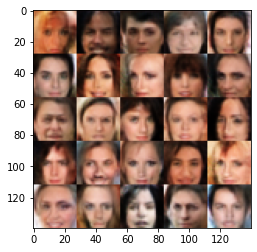

Epoch 2/2 Step 4310... Discriminator Loss: 1.1510... Generator Loss: 1.0743
Epoch 2/2 Step 4320... Discriminator Loss: 1.1477... Generator Loss: 1.0127
Epoch 2/2 Step 4330... Discriminator Loss: 1.1655... Generator Loss: 1.0179
Epoch 2/2 Step 4340... Discriminator Loss: 1.0988... Generator Loss: 1.1507
Epoch 2/2 Step 4350... Discriminator Loss: 1.1240... Generator Loss: 1.0555
Epoch 2/2 Step 4360... Discriminator Loss: 1.1359... Generator Loss: 1.0413
Epoch 2/2 Step 4370... Discriminator Loss: 1.1486... Generator Loss: 0.9796
Epoch 2/2 Step 4380... Discriminator Loss: 1.0513... Generator Loss: 1.2524
Epoch 2/2 Step 4390... Discriminator Loss: 1.1789... Generator Loss: 1.2325
Epoch 2/2 Step 4400... Discriminator Loss: 1.0860... Generator Loss: 0.9950


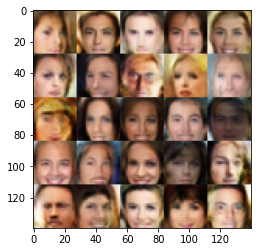

Epoch 2/2 Step 4410... Discriminator Loss: 1.0495... Generator Loss: 1.1292
Epoch 2/2 Step 4420... Discriminator Loss: 1.1523... Generator Loss: 0.9960
Epoch 2/2 Step 4430... Discriminator Loss: 1.1644... Generator Loss: 0.9262
Epoch 2/2 Step 4440... Discriminator Loss: 1.1466... Generator Loss: 1.0391
Epoch 2/2 Step 4450... Discriminator Loss: 1.0390... Generator Loss: 0.9974
Epoch 2/2 Step 4460... Discriminator Loss: 1.0883... Generator Loss: 1.2084
Epoch 2/2 Step 4470... Discriminator Loss: 1.1387... Generator Loss: 0.9690
Epoch 2/2 Step 4480... Discriminator Loss: 1.1572... Generator Loss: 1.0200
Epoch 2/2 Step 4490... Discriminator Loss: 1.1396... Generator Loss: 0.9496
Epoch 2/2 Step 4500... Discriminator Loss: 1.1511... Generator Loss: 1.2522


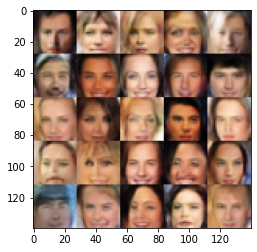

Epoch 2/2 Step 4510... Discriminator Loss: 1.1666... Generator Loss: 0.8350
Epoch 2/2 Step 4520... Discriminator Loss: 1.0373... Generator Loss: 1.3551
Epoch 2/2 Step 4530... Discriminator Loss: 1.2159... Generator Loss: 0.7998
Epoch 2/2 Step 4540... Discriminator Loss: 1.1112... Generator Loss: 1.0600
Epoch 2/2 Step 4550... Discriminator Loss: 1.1461... Generator Loss: 0.9833
Epoch 2/2 Step 4560... Discriminator Loss: 1.1147... Generator Loss: 1.1210
Epoch 2/2 Step 4570... Discriminator Loss: 1.0431... Generator Loss: 1.2109
Epoch 2/2 Step 4580... Discriminator Loss: 1.2765... Generator Loss: 0.7085
Epoch 2/2 Step 4590... Discriminator Loss: 1.1194... Generator Loss: 0.9807
Epoch 2/2 Step 4600... Discriminator Loss: 1.0328... Generator Loss: 1.0790


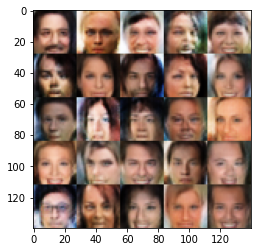

Epoch 2/2 Step 4610... Discriminator Loss: 1.1207... Generator Loss: 0.8764
Epoch 2/2 Step 4620... Discriminator Loss: 1.1016... Generator Loss: 0.8860
Epoch 2/2 Step 4630... Discriminator Loss: 1.1616... Generator Loss: 1.1202
Epoch 2/2 Step 4640... Discriminator Loss: 1.1421... Generator Loss: 1.0585
Epoch 2/2 Step 4650... Discriminator Loss: 1.1137... Generator Loss: 0.8224
Epoch 2/2 Step 4660... Discriminator Loss: 1.1846... Generator Loss: 1.0469
Epoch 2/2 Step 4670... Discriminator Loss: 1.1562... Generator Loss: 0.9191
Epoch 2/2 Step 4680... Discriminator Loss: 1.0867... Generator Loss: 1.2079
Epoch 2/2 Step 4690... Discriminator Loss: 1.1549... Generator Loss: 1.1069
Epoch 2/2 Step 4700... Discriminator Loss: 1.1381... Generator Loss: 1.0586


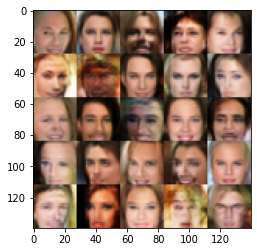

Epoch 2/2 Step 4710... Discriminator Loss: 1.0303... Generator Loss: 1.1017
Epoch 2/2 Step 4720... Discriminator Loss: 1.0895... Generator Loss: 1.0435
Epoch 2/2 Step 4730... Discriminator Loss: 1.0702... Generator Loss: 0.9939
Epoch 2/2 Step 4740... Discriminator Loss: 1.0214... Generator Loss: 1.3520
Epoch 2/2 Step 4750... Discriminator Loss: 1.1247... Generator Loss: 0.9661
Epoch 2/2 Step 4760... Discriminator Loss: 1.0622... Generator Loss: 1.1310
Epoch 2/2 Step 4770... Discriminator Loss: 1.2231... Generator Loss: 0.8189
Epoch 2/2 Step 4780... Discriminator Loss: 1.0832... Generator Loss: 1.1417
Epoch 2/2 Step 4790... Discriminator Loss: 1.1717... Generator Loss: 1.3706
Epoch 2/2 Step 4800... Discriminator Loss: 1.0438... Generator Loss: 0.9815


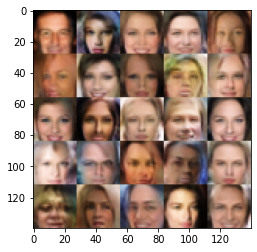

Epoch 2/2 Step 4810... Discriminator Loss: 1.0682... Generator Loss: 1.1157
Epoch 2/2 Step 4820... Discriminator Loss: 1.0451... Generator Loss: 1.0630
Epoch 2/2 Step 4830... Discriminator Loss: 1.0980... Generator Loss: 1.4131
Epoch 2/2 Step 4840... Discriminator Loss: 1.1447... Generator Loss: 1.1712
Epoch 2/2 Step 4850... Discriminator Loss: 1.0643... Generator Loss: 1.0530
Epoch 2/2 Step 4860... Discriminator Loss: 1.1350... Generator Loss: 1.0308
Epoch 2/2 Step 4870... Discriminator Loss: 1.0648... Generator Loss: 1.0590
Epoch 2/2 Step 4880... Discriminator Loss: 1.0977... Generator Loss: 1.1835
Epoch 2/2 Step 4890... Discriminator Loss: 1.1086... Generator Loss: 1.3121
Epoch 2/2 Step 4900... Discriminator Loss: 1.1458... Generator Loss: 1.0057


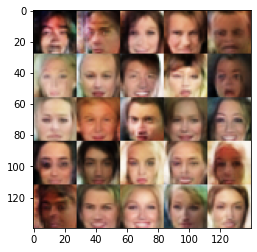

Epoch 2/2 Step 4910... Discriminator Loss: 1.0645... Generator Loss: 1.1667
Epoch 2/2 Step 4920... Discriminator Loss: 1.1273... Generator Loss: 0.8517
Epoch 2/2 Step 4930... Discriminator Loss: 1.1165... Generator Loss: 0.8503
Epoch 2/2 Step 4940... Discriminator Loss: 1.0671... Generator Loss: 1.0702
Epoch 2/2 Step 4950... Discriminator Loss: 1.1309... Generator Loss: 1.3154
Epoch 2/2 Step 4960... Discriminator Loss: 1.0356... Generator Loss: 1.2035
Epoch 2/2 Step 4970... Discriminator Loss: 1.0761... Generator Loss: 1.3214
Epoch 2/2 Step 4980... Discriminator Loss: 1.1168... Generator Loss: 1.4010
Epoch 2/2 Step 4990... Discriminator Loss: 1.0517... Generator Loss: 1.2525
Epoch 2/2 Step 5000... Discriminator Loss: 1.1216... Generator Loss: 1.2740


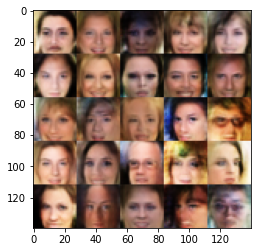

Epoch 2/2 Step 5010... Discriminator Loss: 1.3253... Generator Loss: 0.8026
Epoch 2/2 Step 5020... Discriminator Loss: 1.1109... Generator Loss: 1.0096
Epoch 2/2 Step 5030... Discriminator Loss: 1.2412... Generator Loss: 0.8474
Epoch 2/2 Step 5040... Discriminator Loss: 1.0743... Generator Loss: 1.3870
Epoch 2/2 Step 5050... Discriminator Loss: 1.0419... Generator Loss: 1.1377
Epoch 2/2 Step 5060... Discriminator Loss: 1.0833... Generator Loss: 0.8922
Epoch 2/2 Step 5070... Discriminator Loss: 1.0848... Generator Loss: 1.0546
Epoch 2/2 Step 5080... Discriminator Loss: 1.2868... Generator Loss: 0.6814
Epoch 2/2 Step 5090... Discriminator Loss: 1.0881... Generator Loss: 1.0980
Epoch 2/2 Step 5100... Discriminator Loss: 1.1440... Generator Loss: 1.1193


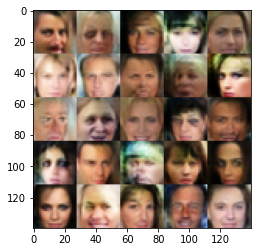

Epoch 2/2 Step 5110... Discriminator Loss: 1.0509... Generator Loss: 1.1342
Epoch 2/2 Step 5120... Discriminator Loss: 1.0960... Generator Loss: 1.1077
Epoch 2/2 Step 5130... Discriminator Loss: 1.0530... Generator Loss: 1.1513
Epoch 2/2 Step 5140... Discriminator Loss: 1.0476... Generator Loss: 1.1718
Epoch 2/2 Step 5150... Discriminator Loss: 1.0573... Generator Loss: 1.2402
Epoch 2/2 Step 5160... Discriminator Loss: 1.1542... Generator Loss: 0.9086
Epoch 2/2 Step 5170... Discriminator Loss: 1.1110... Generator Loss: 1.1056
Epoch 2/2 Step 5180... Discriminator Loss: 1.1427... Generator Loss: 0.8971
Epoch 2/2 Step 5190... Discriminator Loss: 1.0575... Generator Loss: 1.4038
Epoch 2/2 Step 5200... Discriminator Loss: 1.0492... Generator Loss: 1.1327


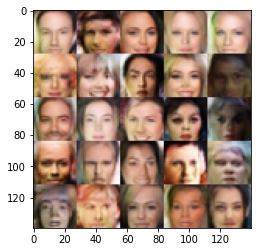

Epoch 2/2 Step 5210... Discriminator Loss: 1.0199... Generator Loss: 1.1360
Epoch 2/2 Step 5220... Discriminator Loss: 1.0918... Generator Loss: 1.5203
Epoch 2/2 Step 5230... Discriminator Loss: 1.1003... Generator Loss: 0.9366
Epoch 2/2 Step 5240... Discriminator Loss: 1.1002... Generator Loss: 0.9797
Epoch 2/2 Step 5250... Discriminator Loss: 1.1146... Generator Loss: 1.0354
Epoch 2/2 Step 5260... Discriminator Loss: 1.1265... Generator Loss: 0.9022
Epoch 2/2 Step 5270... Discriminator Loss: 1.0361... Generator Loss: 1.1344
Epoch 2/2 Step 5280... Discriminator Loss: 1.0887... Generator Loss: 0.9346
Epoch 2/2 Step 5290... Discriminator Loss: 1.0890... Generator Loss: 1.3704
Epoch 2/2 Step 5300... Discriminator Loss: 1.0854... Generator Loss: 0.9735


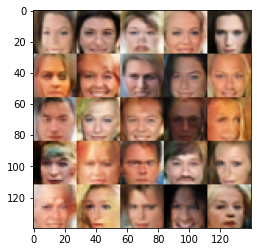

Epoch 2/2 Step 5310... Discriminator Loss: 1.0698... Generator Loss: 1.0538
Epoch 2/2 Step 5320... Discriminator Loss: 1.1190... Generator Loss: 1.0167
Epoch 2/2 Step 5330... Discriminator Loss: 0.9938... Generator Loss: 1.0281
Epoch 2/2 Step 5340... Discriminator Loss: 1.0678... Generator Loss: 1.0461
Epoch 2/2 Step 5350... Discriminator Loss: 1.0054... Generator Loss: 1.3483
Epoch 2/2 Step 5360... Discriminator Loss: 1.1624... Generator Loss: 0.9738
Epoch 2/2 Step 5370... Discriminator Loss: 1.1993... Generator Loss: 0.9405
Epoch 2/2 Step 5380... Discriminator Loss: 1.0586... Generator Loss: 1.2545
Epoch 2/2 Step 5390... Discriminator Loss: 1.0565... Generator Loss: 1.2634
Epoch 2/2 Step 5400... Discriminator Loss: 1.1162... Generator Loss: 0.8702


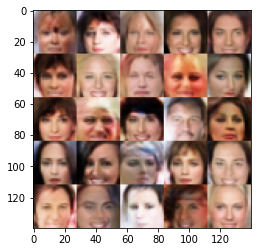

Epoch 2/2 Step 5410... Discriminator Loss: 1.0195... Generator Loss: 1.0361
Epoch 2/2 Step 5420... Discriminator Loss: 1.0865... Generator Loss: 1.0687
Epoch 2/2 Step 5430... Discriminator Loss: 1.0773... Generator Loss: 1.1310
Epoch 2/2 Step 5440... Discriminator Loss: 1.0218... Generator Loss: 1.2745
Epoch 2/2 Step 5450... Discriminator Loss: 1.2115... Generator Loss: 0.7185
Epoch 2/2 Step 5460... Discriminator Loss: 1.0585... Generator Loss: 0.9511
Epoch 2/2 Step 5470... Discriminator Loss: 1.0037... Generator Loss: 1.1251
Epoch 2/2 Step 5480... Discriminator Loss: 1.0315... Generator Loss: 1.1430
Epoch 2/2 Step 5490... Discriminator Loss: 1.0562... Generator Loss: 0.9787
Epoch 2/2 Step 5500... Discriminator Loss: 1.0256... Generator Loss: 0.9083


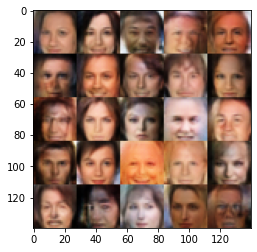

Epoch 2/2 Step 5510... Discriminator Loss: 1.0802... Generator Loss: 1.3736
Epoch 2/2 Step 5520... Discriminator Loss: 1.0589... Generator Loss: 1.3299
Epoch 2/2 Step 5530... Discriminator Loss: 1.2436... Generator Loss: 1.6753
Epoch 2/2 Step 5540... Discriminator Loss: 1.0265... Generator Loss: 1.1250
Epoch 2/2 Step 5550... Discriminator Loss: 1.0444... Generator Loss: 1.2391
Epoch 2/2 Step 5560... Discriminator Loss: 1.1150... Generator Loss: 1.3709
Epoch 2/2 Step 5570... Discriminator Loss: 1.1073... Generator Loss: 0.9091
Epoch 2/2 Step 5580... Discriminator Loss: 1.0075... Generator Loss: 1.1588
Epoch 2/2 Step 5590... Discriminator Loss: 1.0778... Generator Loss: 1.2316
Epoch 2/2 Step 5600... Discriminator Loss: 1.1386... Generator Loss: 0.9264


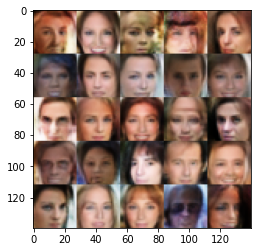

Epoch 2/2 Step 5610... Discriminator Loss: 1.0697... Generator Loss: 1.2343
Epoch 2/2 Step 5620... Discriminator Loss: 1.1240... Generator Loss: 0.8953
Epoch 2/2 Step 5630... Discriminator Loss: 0.9860... Generator Loss: 1.3622
Epoch 2/2 Step 5640... Discriminator Loss: 1.1570... Generator Loss: 1.5646
Epoch 2/2 Step 5650... Discriminator Loss: 1.0383... Generator Loss: 1.1051
Epoch 2/2 Step 5660... Discriminator Loss: 1.0475... Generator Loss: 0.9193
Epoch 2/2 Step 5670... Discriminator Loss: 1.0171... Generator Loss: 1.2692
Epoch 2/2 Step 5680... Discriminator Loss: 1.0474... Generator Loss: 1.0211
Epoch 2/2 Step 5690... Discriminator Loss: 1.1056... Generator Loss: 0.8915
Epoch 2/2 Step 5700... Discriminator Loss: 1.0841... Generator Loss: 1.3538


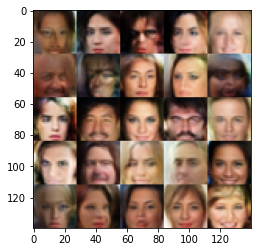

Epoch 2/2 Step 5710... Discriminator Loss: 0.9920... Generator Loss: 1.4345
Epoch 2/2 Step 5720... Discriminator Loss: 1.1081... Generator Loss: 0.8358
Epoch 2/2 Step 5730... Discriminator Loss: 1.0183... Generator Loss: 1.0752
Epoch 2/2 Step 5740... Discriminator Loss: 1.1157... Generator Loss: 1.5286
Epoch 2/2 Step 5750... Discriminator Loss: 1.0167... Generator Loss: 1.5749
Epoch 2/2 Step 5760... Discriminator Loss: 1.0694... Generator Loss: 1.1733
Epoch 2/2 Step 5770... Discriminator Loss: 0.9703... Generator Loss: 1.3182
Epoch 2/2 Step 5780... Discriminator Loss: 1.1025... Generator Loss: 1.5633
Epoch 2/2 Step 5790... Discriminator Loss: 1.0918... Generator Loss: 0.8959
Epoch 2/2 Step 5800... Discriminator Loss: 1.0416... Generator Loss: 1.3955


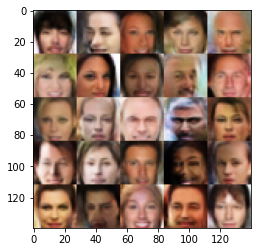

Epoch 2/2 Step 5810... Discriminator Loss: 1.0033... Generator Loss: 1.1473
Epoch 2/2 Step 5820... Discriminator Loss: 1.0378... Generator Loss: 1.1324
Epoch 2/2 Step 5830... Discriminator Loss: 1.0584... Generator Loss: 1.1933
Epoch 2/2 Step 5840... Discriminator Loss: 1.0254... Generator Loss: 1.0728
Epoch 2/2 Step 5850... Discriminator Loss: 1.1191... Generator Loss: 0.9796
Epoch 2/2 Step 5860... Discriminator Loss: 0.9708... Generator Loss: 1.3525
Epoch 2/2 Step 5870... Discriminator Loss: 1.0750... Generator Loss: 1.2806
Epoch 2/2 Step 5880... Discriminator Loss: 1.2541... Generator Loss: 1.7438
Epoch 2/2 Step 5890... Discriminator Loss: 1.1002... Generator Loss: 1.4968
Epoch 2/2 Step 5900... Discriminator Loss: 1.0096... Generator Loss: 1.3355


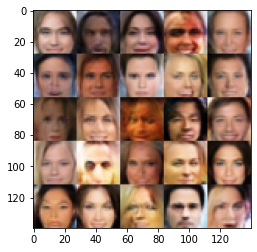

Epoch 2/2 Step 5910... Discriminator Loss: 1.3499... Generator Loss: 1.8625
Epoch 2/2 Step 5920... Discriminator Loss: 1.0887... Generator Loss: 1.1309
Epoch 2/2 Step 5930... Discriminator Loss: 1.1046... Generator Loss: 1.2473
Epoch 2/2 Step 5940... Discriminator Loss: 0.9876... Generator Loss: 1.1539
Epoch 2/2 Step 5950... Discriminator Loss: 1.2795... Generator Loss: 0.6704
Epoch 2/2 Step 5960... Discriminator Loss: 1.0206... Generator Loss: 1.2166
Epoch 2/2 Step 5970... Discriminator Loss: 1.0666... Generator Loss: 1.3148
Epoch 2/2 Step 5980... Discriminator Loss: 1.0633... Generator Loss: 0.9264
Epoch 2/2 Step 5990... Discriminator Loss: 0.9865... Generator Loss: 1.1983
Epoch 2/2 Step 6000... Discriminator Loss: 1.2357... Generator Loss: 1.9625


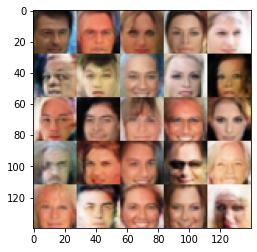

Epoch 2/2 Step 6010... Discriminator Loss: 1.0536... Generator Loss: 0.9830
Epoch 2/2 Step 6020... Discriminator Loss: 1.0446... Generator Loss: 1.1473
Epoch 2/2 Step 6030... Discriminator Loss: 0.9744... Generator Loss: 1.3714
Epoch 2/2 Step 6040... Discriminator Loss: 1.0036... Generator Loss: 1.1155
Epoch 2/2 Step 6050... Discriminator Loss: 0.9919... Generator Loss: 1.3675
Epoch 2/2 Step 6060... Discriminator Loss: 1.0698... Generator Loss: 0.9964
Epoch 2/2 Step 6070... Discriminator Loss: 1.0218... Generator Loss: 1.2759
Epoch 2/2 Step 6080... Discriminator Loss: 1.1578... Generator Loss: 1.0318
Epoch 2/2 Step 6090... Discriminator Loss: 1.4174... Generator Loss: 0.6188
Epoch 2/2 Step 6100... Discriminator Loss: 1.0695... Generator Loss: 1.1702


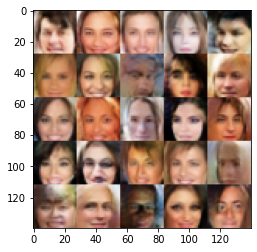

Epoch 2/2 Step 6110... Discriminator Loss: 1.0716... Generator Loss: 1.5864
Epoch 2/2 Step 6120... Discriminator Loss: 1.0113... Generator Loss: 1.4081
Epoch 2/2 Step 6130... Discriminator Loss: 1.0776... Generator Loss: 1.2797
Epoch 2/2 Step 6140... Discriminator Loss: 0.9881... Generator Loss: 1.0614
Epoch 2/2 Step 6150... Discriminator Loss: 1.0719... Generator Loss: 1.4866
Epoch 2/2 Step 6160... Discriminator Loss: 0.9903... Generator Loss: 1.1364
Epoch 2/2 Step 6170... Discriminator Loss: 1.0802... Generator Loss: 0.9090
Epoch 2/2 Step 6180... Discriminator Loss: 1.0657... Generator Loss: 0.8997
Epoch 2/2 Step 6190... Discriminator Loss: 1.1115... Generator Loss: 1.4525
Epoch 2/2 Step 6200... Discriminator Loss: 1.0511... Generator Loss: 1.1152


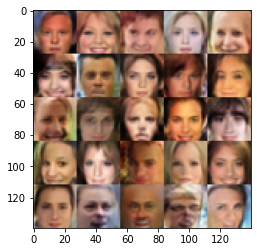

Epoch 2/2 Step 6210... Discriminator Loss: 1.1313... Generator Loss: 1.1764
Epoch 2/2 Step 6220... Discriminator Loss: 1.1024... Generator Loss: 0.8819
Epoch 2/2 Step 6230... Discriminator Loss: 1.0105... Generator Loss: 1.1437
Epoch 2/2 Step 6240... Discriminator Loss: 1.0855... Generator Loss: 0.8651
Epoch 2/2 Step 6250... Discriminator Loss: 1.0003... Generator Loss: 1.2440
Epoch 2/2 Step 6260... Discriminator Loss: 1.0343... Generator Loss: 1.6928
Epoch 2/2 Step 6270... Discriminator Loss: 1.1208... Generator Loss: 0.9469
Epoch 2/2 Step 6280... Discriminator Loss: 1.1159... Generator Loss: 1.0822
Epoch 2/2 Step 6290... Discriminator Loss: 1.0092... Generator Loss: 1.4797
Epoch 2/2 Step 6300... Discriminator Loss: 1.0783... Generator Loss: 1.5153


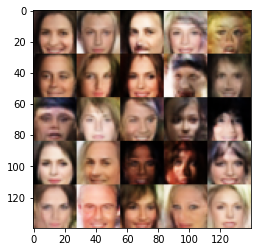

Epoch 2/2 Step 6310... Discriminator Loss: 0.9291... Generator Loss: 1.2511
Epoch 2/2 Step 6320... Discriminator Loss: 1.1312... Generator Loss: 1.2161
Epoch 2/2 Step 6330... Discriminator Loss: 1.0518... Generator Loss: 1.3129


In [15]:
batch_size = 64
z_dim = 100
learning_rate = 0.00025
beta1 = 0.45

epochs = 2

celeba_dataset = Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

In [0]:
# Thanks
# FarrokhKarimi